In [ ]:

!unzip /content/objectdet.zip -d /content/


Archive:  /content/objectdet.zip
  inflating: /content/dataset5/data.yaml  
   creating: /content/dataset5/images/
   creating: /content/dataset5/labels/
  inflating: /content/dataset5/labels/train.cache  
   creating: /content/dataset5/labels/train/
  inflating: /content/dataset5/labels/train/0.txt  
  inflating: /content/dataset5/labels/train/1.txt  
  inflating: /content/dataset5/labels/train/10.txt  
  inflating: /content/dataset5/labels/train/100.txt  
  inflating: /content/dataset5/labels/train/1000.txt  
  inflating: /content/dataset5/labels/train/1001.txt  
  inflating: /content/dataset5/labels/train/1002.txt  
  inflating: /content/dataset5/labels/train/1003.txt  
  inflating: /content/dataset5/labels/train/1004.txt  
  inflating: /content/dataset5/labels/train/1005.txt  
  inflating: /content/dataset5/labels/train/1006.txt  
  inflating: /content/dataset5/labels/train/1007.txt  
  inflating: /content/dataset5/labels/train/1008.txt  
  inflating: /content/dataset5/labels/train

In [ ]:
# Install deps (run once)
!git clone https://github.com/apple/ml-depth-pro.git
%cd ml-depth-pro
!pip install -e .
!pip install ultralytics

Cloning into 'ml-depth-pro'...
remote: Enumerating objects: 48, done.
remote: Counting objects: 100% (27/27), done.
remote: Compressing objects: 100% (25/25), done.
remote: Total 48 (delta 9), reused 2 (delta 2), pack-reused 21 (from 1)
Receiving objects: 100% (48/48), 2.50 MiB | 67.43 MiB/s, done.
Resolving deltas: 100% (9/9), done.
/content/ml-depth-pro
Obtaining file:///content/ml-depth-pro
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 68.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 64.0 MB/s eta 0:00:00
  Building editable for depth_pro (pyproject.toml) ... done
  Created wheel for depth_pro: filename=depth_pro-0.1-0.editable-py3-none-any.whl size=4834 sha256=

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 55.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.5/16.5 MB 97.4 MB/s eta 0:00:00
^C


In [ ]:
!pip install ultralytics

  Using cached ultralytics-8.3.237-py3-none-any.whl.metadata (37 kB)
  Using cached ultralytics_thop-2.0.18-py3-none-any.whl.metadata (14 kB)
  Using cached numpy-2.2.6-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (62 kB)
Using cached ultralytics-8.3.237-py3-none-any.whl (1.2 MB)
Using cached numpy-2.2.6-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (16.5 MB)
Using cached ultralytics_thop-2.0.18-py3-none-any.whl (28 kB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
depth-pro 0.1 requires numpy<2, but you have numpy 2.2.6 which is incompatible.
numba 0.60.0 requires numpy<2.1,>=1.22, but you have numpy 2.2.6 which is incompatible.
tensorflow 2.19.0 requires numpy<2.2.0,>=1.26.

In [ ]:
# ---------- DOWNLOAD DEPTHPRO CHECKPOINT (run this FIRST) ----------
import os
if not os.path.exists("./checkpoints"):
    os.makedirs("./checkpoints", exist_ok=True)

!pip install huggingface-hub
!huggingface-cli download apple/DepthPro --local-dir ./checkpoints

print("✅ DepthPro checkpoint downloaded to ./checkpoints/")


⚠️  Warning: 'huggingface-cli download' is deprecated. Use 'hf download' instead.
Fetching 4 files:   0% 0/4 [00:00<?, ?it/s]Downloading 'depth_pro.pt' to 'checkpoints/.cache/huggingface/download/UjbKpkiyLv5EzhxcICsNZwd36hI=.3eb35ca68168ad3d14cb150f8947a4edf85589941661fdb2686259c80685c0ce.incomplete'

LICENSE: 5.82kB [00:00, 12.3MB/s]
Download complete. Moving file to checkpoints/LICENSE

.gitattributes: 1.52kB [00:00, 7.79MB/s]
Download complete. Moving file to checkpoints/.gitattributes
Fetching 4 files:  25% 1/4 [00:00<00:01,  2.82it/s]Downloading 'README.md' to 'checkpoints/.cache/huggingface/download/Xn7B-BWUGOee2Y6hCZtEhtFu4BE=.fa20492694045eec7c5feacec12d028a8b154660.incomplete'

README.md: 3.66kB [00:00, 20.9MB/s]
Download complete. Moving file to checkpoints/README.md

depth_pro.pt:   0% 0.00/1.90G [00:00<?, ?B/s]
depth_pro.pt:   4% 67.1M/1.90G [00:02<01:07, 27.3MB/s]
depth_pro.pt:  46% 872M/1.90G [00:02<00:02, 437MB/s]  
depth_pro.pt:  58% 1.10G/1.90G [00:07<00:05, 136MB/s]
d

In [ ]:
!pip install easyocr

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 87.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 180.7/180.7 kB 15.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 978.2/978.2 kB 56.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 300.6/300.6 kB 25.0 MB/s eta 0:00:00


In [ ]:
# ================== ONE-TIME INSTALL (if not done) ==================
# !pip install easyocr ultralytics
# !git clone https://github.com/apple/ml-depth-pro.git
# %cd ml-depth-pro
# !pip install -e .
# %cd /content
# ===================================================================

import torch
import numpy as np
import json
from ultralytics import YOLO
import depth_pro
import os
from datetime import datetime, timezone
from google.colab import files
import zipfile
import easyocr
import cv2
import re

# ---------- CONFIG ----------
WEIGHTS = "/content/best (4).pt"
IMAGE_PATH = "/content/dataset5/images/val/332.jpg"
ONNX_PATH = "/content/best (4).onnx"          # <‑‑ use real exported name
ONNX_WITH_JSON_PATH = "/content/best_with_json.onnx"
JSON_PATH = "/content/detection_results.json"
ZIP_PATH = "/content/road_asset_package.zip"

print("🚀 Road Asset Detection + Geo Metadata + ONNX Export Starting...")

# ---------- OCR INITIALIZATION ----------
ocr_reader = easyocr.Reader(['en'])

def extract_overlay_text(image_path):
    img = cv2.imread(image_path)
    h, w, _ = img.shape
    top_banner = img[0:int(0.30 * h), :]
    result = ocr_reader.readtext(top_banner, detail=0)
    return " ".join(result)

def parse_lat_lon_chainage(text):
    # Your OCR example had "Latitude 2.09749..." and "Longitude 79.735..."
    # so make ":" optional.
    lat = lon = chainage = None

    m_lat = re.search(r"Lat(?:itude)?\s*[: ]\s*([0-9.+\-]+)", text, re.IGNORECASE)
    if m_lat:
        lat = float(m_lat.group(1))

    m_lon = re.search(r"Lon(?:gitude)?\s*[: ]\s*([0-9.+\-]+)", text, re.IGNORECASE)
    if m_lon:
        lon = float(m_lon.group(1))

    m_ch = re.search(r"Chainage\s*[: ]\s*([0-9.+\-]+)\s*km", text, re.IGNORECASE)
    if m_ch:
        chainage = float(m_ch.group(1))

    return lat, lon, chainage

# ---------- STEP 0: GEO METADATA FROM IMAGE ----------
print("\n0️⃣ Extracting geo metadata from image overlay...")
overlay_text = extract_overlay_text(IMAGE_PATH)
lat_val, lon_val, chainage_km = parse_lat_lon_chainage(overlay_text)
print("OCR text:", overlay_text)
print(f"🔎 Parsed -> lat={lat_val}, lon={lon_val}, chainage_km={chainage_km}")

# ---------- STEP 1: EXPORT YOLO TO ONNX ----------
print("\n1️⃣ Converting YOLO to ONNX...")
yolo_model = YOLO(WEIGHTS)
# This will actually create "/content/best (2).onnx"
yolo_model.export(format="onnx", imgsz=640, simplify=False, dynamic=False, opset=12)
print(f"✅ ONNX exported: {ONNX_PATH}")

# ---------- STEP 2: LOAD DEPTHPRO ----------
print("\n2️⃣ Loading DepthPro...")
dp_model, dp_tf = depth_pro.create_model_and_transforms()
dp_model.eval()

# ---------- STEP 3: RUN DEPTHPRO ----------
print("3️⃣ Running DepthPro...")
rgb, _, f_px = depth_pro.load_rgb(IMAGE_PATH)
img_t = dp_tf(rgb)

with torch.no_grad():
    pred_dp = dp_model.infer(img_t, f_px=f_px)
depth = pred_dp["depth"].cpu().numpy()
focal_px = float(pred_dp["focallength_px"])
H, W = depth.shape
print(f"✅ Depth map: {H}x{W}, focal: {focal_px:.1f}px")

# ---------- STEP 4: YOLO DETECTION ----------
print("\n4️⃣ Running YOLO detection...")
res = yolo_model(IMAGE_PATH, conf=0.25, iou=0.5)[0]
names = res.names
print(f"✅ Detected {len(res.boxes)} assets")

# ---------- STEP 5: HELPERS ----------
def estimate_size_3d(box, depth_np, f_px, cx=None, cy=None):
    H_img, W_img = depth_np.shape
    if cx is None: cx = W_img / 2.0
    if cy is None: cy = H_img / 2.0

    x1, y1, x2, y2 = box.xyxy[0].tolist()
    x1, x2 = int(np.clip(x1, 0, W_img-1)), int(np.clip(x2, 0, W_img-1))
    y1, y2 = int(np.clip(y1, 0, H_img-1)), int(np.clip(y2, 0, H_img-1))

    uL, vL = x1, (y1 + y2) // 2
    uR, vR = x2, (y1 + y2) // 2
    uT, vT = (x1 + x2) // 2, y1
    uB, vB = (x1 + x2) // 2, y2

    ZL, ZR, ZT, ZB = [float(depth_np[v, u]) for v, u in [(vL, uL), (vR, uR), (vT, uT), (vB, uB)]]
    if not all(np.isfinite(z) and z > 0 for z in [ZL, ZR, ZT, ZB]):
        return None, None

    def px_to_3d(u, v, Z):
        X = (u - cx) * Z / f_px
        Y = (v - cy) * Z / f_px
        return np.array([X, Y, Z], dtype=float)

    PL = px_to_3d(uL, vL, ZL)
    PR = px_to_3d(uR, vR, ZR)
    PT = px_to_3d(uT, vT, ZT)
    PB = px_to_3d(uB, vB, ZB)

    width_m = float(np.linalg.norm(PR - PL))
    height_m = float(np.linalg.norm(PB - PT))
    return width_m, height_m

def estimate_road_width(depth_np, f_px, row_ratio=0.6, z_min=5.0, z_max=40.0):
    H_img, W_img = depth_np.shape
    row = int(row_ratio * H_img)
    row_depth = depth_np[row, :]
    valid = (row_depth > z_min) & (row_depth < z_max)
    idx = np.where(valid)[0]
    if len(idx) < 2:
        return None, row, None, None
    x_left, x_right = idx[0], idx[-1]
    z_mean = 0.5 * (row_depth[x_left] + row_depth[x_right])
    pixel_width = abs(x_right - x_left)
    return pixel_width / f_px * z_mean, row, x_left, x_right

# ---------- STEP 6: PROCESS DETECTIONS ----------
print("\n5️⃣ Processing detections...")
detected_assets = []
for box in res.boxes:
    x1, y1, x2, y2 = box.xyxy[0].tolist()
    cls_id = int(box.cls[0].item())
    conf = float(box.conf[0].item())
    label = names[cls_id]

    cx, cy = int((x1 + x2) / 2), int((y1 + y2) / 2)
    cy_d = int(np.clip(cy, 0, H-1))
    cx_d = int(np.clip(cx, 0, W-1))
    dist_center = float(depth[cy_d, cx_d])

    width_m, height_m = estimate_size_3d(box, depth, focal_px)

    asset = {
        "assetname": label,
        "distance_from_cam_m": round(dist_center, 2),
        "asset_length_m": round(height_m, 2) if height_m else 0.0,
        "asset_width_m": round(width_m, 2) if width_m else 0.0,
        "confidence": round(conf, 2),
        "bbox": [round(x1, 1), round(y1, 1), round(x2, 1), round(y2, 1)]
    }
    detected_assets.append(asset)

road_width_m, row_used, xL, xR = estimate_road_width(depth, focal_px)
road_width_val = round(road_width_m, 2) if road_width_m is not None else None

# ---------- STEP 7: CREATE COMPLETE JSON ----------
complete_json = {
    "time_taken": datetime.now(timezone.utc).isoformat(),
    "lat": lat_val,
    "lon": lon_val,
    "chainage_km": chainage_km,
    "road_length": "",
    "road_width_m": road_width_val,
    "image_path": IMAGE_PATH,
    "focal_length_px": round(focal_px, 2),
    "image_shape": [H, W],
    "model_info": {
        "names": dict(names),
        "task": "detect",
        "imgsz": 640,
        "conf_threshold": 0.25,
        "detections_count": len(detected_assets)
    },
    "detected_assets": detected_assets
}

if road_width_val is not None:
    complete_json["road_width_details"] = {
        "row_used": row_used,
        "x_left": int(xL),
        "x_right": int(xR)
    }

# ---------- STEP 8: SAVE JSON + UPDATE ONNX ----------
print("\n6️⃣ Saving JSON and updating ONNX...")
with open(JSON_PATH, 'w') as f:
    json.dump(complete_json, f, indent=2)

try:
    import onnx
    model_onnx = onnx.load(ONNX_PATH)
    model_onnx.metadata_props.extend([
        onnx.StringStringEntryProto(key="json_config_path", value=JSON_PATH),
        onnx.StringStringEntryProto(key="lat", value=str(lat_val) if lat_val is not None else ""),
        onnx.StringStringEntryProto(key="lon", value=str(lon_val) if lon_val is not None else ""),
        onnx.StringStringEntryProto(key="chainage_km", value=str(chainage_km) if chainage_km is not None else ""),
        onnx.StringStringEntryProto(key="detection_count", value=str(len(detected_assets))),
        onnx.StringStringEntryProto(key="road_width_m", value=str(road_width_val) if road_width_val is not None else "None"),
        onnx.StringStringEntryProto(key="timestamp", value=complete_json["time_taken"])
    ])
    onnx.save(model_onnx, ONNX_WITH_JSON_PATH)
    print(f"✅ ONNX metadata updated: {ONNX_WITH_JSON_PATH}")
except Exception as e:
    print(f"⚠️ ONNX metadata skipped: {e}")
    ONNX_WITH_JSON_PATH = ONNX_PATH

# ---------- STEP 9: CREATE DOWNLOAD PACKAGE ----------
print("\n7️⃣ Creating download package (ONNX + JSON)...")
with zipfile.ZipFile(ZIP_PATH, 'w', zipfile.ZIP_DEFLATED) as zipf:
    zipf.write(ONNX_WITH_JSON_PATH, os.path.basename(ONNX_WITH_JSON_PATH))
    zipf.write(JSON_PATH, os.path.basename(JSON_PATH))
    zipf.write(ONNX_PATH, os.path.basename(ONNX_PATH))

# ---------- STEP 10: FINAL OUTPUT ----------
print("\n🎉 FINAL RESULTS JSON:")
print(json.dumps(complete_json, indent=2))

print(f"\n⬇️ Downloading ZIP: {ZIP_PATH}")
files.download(ZIP_PATH)

print("\n✅ COMPLETE! ONNX + JSON package ready for WPF.")


🚀 Road Asset Detection + Geo Metadata + ONNX Export Starting...

0️⃣ Extracting geo metadata from image overlay...
OCR text: Project SurverylD: Puducherry Tindivanam 13 SectionCode: Client ID: NHAI Latitude 2.0974931716919 N Survery Location: Puducherry to Tindivanam Longitude 79.7355651855469 E NH Number: NH-32 Altitude 34.6 meter Old NH Number: NH-66 Distance 48 km, Chainage 21.18 km, Speed 27 km/hr LRP KM Stone 022024 1346.40 to
🔎 Parsed -> lat=2.0974931716919, lon=79.7355651855469, chainage_km=21.18

1️⃣ Converting YOLO to ONNX...
Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CPU (Intel Xeon CPU @ 2.20GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/
Model summary (fused): 72 layers, 11,140,677 parameters, 0 gradients, 28.5 GFLOPs

PyTorch: starting from '/content/best (4).pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 43, 8400) (21.6 MB)
requirements: Ultra

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


✅ COMPLETE! ONNX + JSON package ready for WPF.


In [ ]:
import onnx

ONNX_PATH = "/content/best_with_json.onnx"  # or best (2).onnx

model = onnx.load(ONNX_PATH)

print("=== METADATA KEYS & VALUES ===")
for p in model.metadata_props:
    print(f"{p.key}: {p.value}")


=== METADATA KEYS & VALUES ===
description: Ultralytics best (4) model trained on /content/objectdet/content/objectdet/dataset5/data.yaml
author: Ultralytics
date: 2025-12-13T04:51:15.197999
version: 8.3.237
license: AGPL-3.0 License (https://ultralytics.com/license)
docs: https://docs.ultralytics.com
stride: 32
task: detect
batch: 1
imgsz: [640, 640]
names: {0: 'Acoustic Barrier', 1: 'Avenue Plantation', 2: 'Bus Bay & Shelters', 3: 'CCTV', 4: 'Chevron Signs', 5: 'Concrete Barrier', 6: 'Delineators', 7: 'ECB (SOS Facility)', 8: 'Entry & Exit', 9: 'Fencing', 10: 'Footpath', 11: 'Fuel Station', 12: 'Gantry Boards', 13: 'Hectometer stones', 14: 'High Mast Light', 15: 'Kerb', 16: 'Ordinary Kilometer stones', 17: 'Land Use', 18: 'Major Intersections', 19: 'Median Drain', 20: 'Median Openings', 21: 'Median Plantation', 22: 'Metal Beam Crash Barrier (MBCB)', 23: 'Minor Intersection', 24: 'New Jersey Crash Barrier', 25: 'OHM', 26: 'Parapet wall', 27: 'Pedestrian Guard Rail', 28: 'Ramps', 29: '

In [ ]:
!unzip -FF "/content/objectdet.zip" -d "/content/objectdet/"

Archive:  /content/objectdet.zip
  inflating: /content/objectdet/dataset5/data.yaml  
   creating: /content/objectdet/dataset5/images/
   creating: /content/objectdet/dataset5/labels/
  inflating: /content/objectdet/dataset5/labels/train.cache  
   creating: /content/objectdet/dataset5/labels/train/
  inflating: /content/objectdet/dataset5/labels/train/0.txt  
  inflating: /content/objectdet/dataset5/labels/train/1.txt  
  inflating: /content/objectdet/dataset5/labels/train/10.txt  
  inflating: /content/objectdet/dataset5/labels/train/100.txt  
  inflating: /content/objectdet/dataset5/labels/train/1000.txt  
  inflating: /content/objectdet/dataset5/labels/train/1001.txt  
  inflating: /content/objectdet/dataset5/labels/train/1002.txt  
  inflating: /content/objectdet/dataset5/labels/train/1003.txt  
  inflating: /content/objectdet/dataset5/labels/train/1004.txt  
  inflating: /content/objectdet/dataset5/labels/train/1005.txt  
  inflating: /content/objectdet/dataset5/labels/train/1006

In [ ]:
!pip install ultralytics

In [ ]:
import yaml, os

DATA_YAML = "/content/objectdet/dataset5/data.yaml"

with open(DATA_YAML, "r") as f:
    data = yaml.safe_load(f)

# Force correct relative folders inside the dataset root
data["path"]  = "/content/objectdet/dataset5"
data["train"] = "images/train"
data["val"]   = "images/val"   # or "images/valid" if that is your folder name

with open(DATA_YAML, "w") as f:
    yaml.safe_dump(data, f, sort_keys=False)

print("Fixed data.yaml:")
print(open(DATA_YAML).read())


Fixed data.yaml:
train: images/train
val: images/val
nc: 39
names:
- Acoustic Barrier
- Avenue Plantation
- Bus Bay & Shelters
- CCTV
- Chevron Signs
- Concrete Barrier
- Delineators
- ECB (SOS Facility)
- Entry & Exit
- Fencing
- Footpath
- Fuel Station
- Gantry Boards
- Hectometer stones
- High Mast Light
- Kerb
- Ordinary Kilometer stones
- Land Use
- Major Intersections
- Median Drain
- Median Openings
- Median Plantation
- Metal Beam Crash Barrier (MBCB)
- Minor Intersection
- New Jersey Crash Barrier
- OHM
- Parapet wall
- Pedestrian Guard Rail
- Ramps
- RCC Railing
- Road Studs
- Safety Hand Railing
- Service Roads/ Slip Roads
- Shoulder Drains
- Sign Boards
- Solar LED Blinkers
- Street Lights
- Toll Plaza
- VMS
path: /content/objectdet/dataset5



In [ ]:
from ultralytics import YOLO

model = YOLO("yolov8m.pt")

model.train(
    data="/content/objectdet/dataset5/data.yaml",
    epochs=200,
    imgsz=1280,
    batch=8,
    lr0=0.01,
    lrf=0.01,
    cos_lr=True,
    patience=30,
    weight_decay=0.0005,
    multi_scale=True,
    hsv_h=0.015,
    hsv_s=0.7,
    hsv_v=0.4,
    degrees=5,
    translate=0.1,
    scale=0.5,
    shear=2,
    fliplr=0.5,
    mosaic=1.0,
    mixup=0.1,
    copy_paste=0.1,
    device=0,
    project="highway_assets",
    name="yolov8m_39cls",
    pretrained=True
)


Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.1, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/objectdet/dataset5/data.yaml, degrees=5, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=200, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1280, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=True, name=yolov8m_39cls5, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=30, perspective

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 38])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7cb140f88d70>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038, 

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/highway_assets/yolov8m_39cls5/weights/best.pt")

metrics = model.val(
    data="/content/objectdet/dataset5/data.yaml",
    imgsz=1280,
    conf=0.25,
    iou=0.2,
    device=0
)

print("Mean Precision (mp):", metrics.box.mp)
print("Mean Recall (mr):", metrics.box.mr)
print("mAP@0.5:", metrics.box.map50)
print("mAP@0.5:0.95:", metrics.box.map)


Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
Model summary (fused): 92 layers, 25,862,341 parameters, 0 gradients, 78.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3979.1±734.7 MB/s, size: 717.0 KB)
val: Scanning /content/objectdet/dataset5/labels/val.cache... 273 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 273/273 514.6Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 18/18 3.5it/s 5.2s
                   all        273       1866      0.454      0.205      0.325      0.157
     Avenue Plantation         16         16      0.417      0.312      0.353     0.0742
    Bus Bay & Shelters          1          2          0          0          0          0
                  CCTV         13         33      0.833      0.152      0.506      0.233
         Chevron Signs          6         10       0.75        0.3      0.561      0.324
      Concrete Barrier 

In [ ]:
# 15-12-2025 adding 100 images extra

In [ ]:
!unzip -FF "/content/objectdet.zip" -d "/content/objectdet/"

Archive:  /content/objectdet.zip
  inflating: /content/objectdet/dataset5/data.yaml  
   creating: /content/objectdet/dataset5/images/
   creating: /content/objectdet/dataset5/labels/
  inflating: /content/objectdet/dataset5/labels/train.cache  
   creating: /content/objectdet/dataset5/labels/train/
  inflating: /content/objectdet/dataset5/labels/train/0.txt  
  inflating: /content/objectdet/dataset5/labels/train/1.txt  
  inflating: /content/objectdet/dataset5/labels/train/10.txt  
  inflating: /content/objectdet/dataset5/labels/train/100.txt  
  inflating: /content/objectdet/dataset5/labels/train/1000.txt  
  inflating: /content/objectdet/dataset5/labels/train/1001.txt  
  inflating: /content/objectdet/dataset5/labels/train/1002.txt  
  inflating: /content/objectdet/dataset5/labels/train/1003.txt  
  inflating: /content/objectdet/dataset5/labels/train/1004.txt  
  inflating: /content/objectdet/dataset5/labels/train/1005.txt  
  inflating: /content/objectdet/dataset5/labels/train/1006

In [ ]:
!pip install ultralytics

In [ ]:
import yaml, os

DATA_YAML = "/content/objectdet/dataset5/data.yaml"

with open(DATA_YAML, "r") as f:
    data = yaml.safe_load(f)

# Force correct relative folders inside the dataset root
data["path"]  = "/content/objectdet/dataset5"
data["train"] = "images/train"
data["val"]   = "images/val"   # or "images/valid" if that is your folder name

with open(DATA_YAML, "w") as f:
    yaml.safe_dump(data, f, sort_keys=False)

print("Fixed data.yaml:")
print(open(DATA_YAML).read())


Fixed data.yaml:
train: images/train
val: images/val
nc: 39
names:
- Acoustic Barrier
- Avenue Plantation
- Bus Bay & Shelters
- CCTV
- Chevron Signs
- Concrete Barrier
- Delineators
- ECB (SOS Facility)
- Entry & Exit
- Fencing
- Footpath
- Fuel Station
- Gantry Boards
- Hectometer stones
- High Mast Light
- Kerb
- Ordinary Kilometer stones
- Land Use
- Major Intersections
- Median Drain
- Median Openings
- Median Plantation
- Metal Beam Crash Barrier (MBCB)
- Minor Intersection
- New Jersey Crash Barrier
- OHM
- Parapet wall
- Pedestrian Guard Rail
- Ramps
- RCC Railing
- Road Studs
- Safety Hand Railing
- Service Roads/ Slip Roads
- Shoulder Drains
- Sign Boards
- Solar LED Blinkers
- Street Lights
- Toll Plaza
- VMS
path: /content/objectdet/dataset5



In [ ]:
from ultralytics import YOLO

model = YOLO("/content/latestbest.pt")   # your trained model

model.train(
    data="/content/objectdet/dataset5/data.yaml",
    epochs=100,
    imgsz=1280,
    batch=8,
    lr0=0.001,       # LOWER learning rate
    patience=30,
    device=0,
    project="highway_assets",
    name="yolov8m_39cls"
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/objectdet/dataset5/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1280, int8=Fal

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 38])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e60fa2e2300>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038, 

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/highway_assets/yolov8m_39cls/weights/best.pt")

metrics = model.val(
    data="/content/objectdet/dataset5/data.yaml",
    imgsz=1280,
    conf=0.25,
    iou=0.2,
    device=0
)

print("Mean Precision (mp):", metrics.box.mp)
print("Mean Recall (mr):", metrics.box.mr)
print("mAP@0.5:", metrics.box.map50)
print("mAP@0.5:0.95:", metrics.box.map)


Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
Model summary (fused): 92 layers, 25,862,341 parameters, 0 gradients, 78.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3347.7±1015.4 MB/s, size: 678.2 KB)
val: Scanning /content/objectdet/dataset5/labels/val.cache... 273 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 273/273 717.9Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 18/18 3.5it/s 5.1s
                   all        273       1866      0.421      0.213      0.313      0.164
     Avenue Plantation         16         16      0.667      0.125      0.375       0.15
    Bus Bay & Shelters          1          2          0          0          0          0
                  CCTV         13         33      0.583      0.212      0.416      0.128
         Chevron Signs          6         10          1        0.3       0.65      0.381
      Concrete Barrier

In [ ]:
!ls /content/objectdet/dataset5/images/train | wc -l
!ls /content/objectdet/dataset5/images/val   | wc -l



740
273


In [ ]:
import os
import yaml
from collections import defaultdict

# paths
data_yaml = "/content/objectdet/dataset5/data.yaml"
label_dir = "/content/objectdet/dataset5/labels/train"

# load class names
with open(data_yaml) as f:
    data = yaml.safe_load(f)

names = data["names"]

# count assets
class_counts = defaultdict(int)

for file in os.listdir(label_dir):
    if file.endswith(".txt"):
        with open(os.path.join(label_dir, file)) as f:
            for line in f:
                if line.strip():
                    cls_id = int(line.split()[0])
                    class_counts[names[cls_id]] += 1

print("📊 Training asset count per class:\n")
for cls_name, count in class_counts.items():
    print(f"{cls_name}: {count}")


📊 Training asset count per class:

Sign Boards: 456
Street Lights: 1272
Concrete Barrier: 101
Kerb: 276
Entry & Exit: 54
Median Plantation: 309
Service Roads/ Slip Roads: 50
Parapet wall: 23
Hectometer stones: 169
Land Use: 79
Footpath: 52
Shoulder Drains: 184
Major Intersections: 26
Minor Intersection: 117
Fuel Station: 21
Gantry Boards: 170
Median Drain: 6
Fencing: 95
Median Openings: 57
RCC Railing: 133
Road Studs: 278
Solar LED Blinkers: 86
Metal Beam Crash Barrier (MBCB): 304
CCTV: 71
New Jersey Crash Barrier: 53
Ordinary Kilometer stones: 36
Avenue Plantation: 54
Pedestrian Guard Rail: 5
Delineators: 89
High Mast Light: 36
Acoustic Barrier: 13
VMS: 34
Chevron Signs: 37
ECB (SOS Facility): 11
Bus Bay & Shelters: 8
Safety Hand Railing: 1
Toll Plaza: 3


In [ ]:
# Adding extra parapet-wall and Toll Plaza images

In [ ]:
!unzip -FF "/content/objectdet3.zip" -d "/content/objectdet3/"

Archive:  /content/objectdet3.zip
  inflating: /content/objectdet3/dataset5/data.yaml  
   creating: /content/objectdet3/dataset5/images/
   creating: /content/objectdet3/dataset5/labels/
  inflating: /content/objectdet3/dataset5/labels/train.cache  
   creating: /content/objectdet3/dataset5/labels/train/
  inflating: /content/objectdet3/dataset5/labels/train/0.txt  
  inflating: /content/objectdet3/dataset5/labels/train/1.txt  
  inflating: /content/objectdet3/dataset5/labels/train/10.txt  
  inflating: /content/objectdet3/dataset5/labels/train/100.txt  
  inflating: /content/objectdet3/dataset5/labels/train/1000.txt  
  inflating: /content/objectdet3/dataset5/labels/train/1001.txt  
  inflating: /content/objectdet3/dataset5/labels/train/1002.txt  
  inflating: /content/objectdet3/dataset5/labels/train/1003.txt  
  inflating: /content/objectdet3/dataset5/labels/train/1004.txt  
  inflating: /content/objectdet3/dataset5/labels/train/1005.txt  
  inflating: /content/objectdet3/dataset5/

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 20.9 MB/s eta 0:00:00


In [ ]:
import yaml, os

DATA_YAML = "/content/objectdet3/dataset5/data.yaml"

with open(DATA_YAML, "r") as f:
    data = yaml.safe_load(f)

# Force correct relative folders inside the dataset root
data["path"]  = "/content/objectdet3/dataset5"
data["train"] = "images/train"
data["val"]   = "images/val"   # or "images/valid" if that is your folder name

with open(DATA_YAML, "w") as f:
    yaml.safe_dump(data, f, sort_keys=False)

print("Fixed data.yaml:")
print(open(DATA_YAML).read())


Fixed data.yaml:
train: images/train
val: images/val
nc: 39
names:
- Acoustic Barrier
- Avenue Plantation
- Bus Bay & Shelters
- CCTV
- Chevron Signs
- Concrete Barrier
- Delineators
- ECB (SOS Facility)
- Entry & Exit
- Fencing
- Footpath
- Fuel Station
- Gantry Boards
- Hectometer stones
- High Mast Light
- Kerb
- Ordinary Kilometer stones
- Land Use
- Major Intersections
- Median Drain
- Median Openings
- Median Plantation
- Metal Beam Crash Barrier (MBCB)
- Minor Intersection
- New Jersey Crash Barrier
- OHM
- Parapet wall
- Pedestrian Guard Rail
- Ramps
- RCC Railing
- Road Studs
- Safety Hand Railing
- Service Roads/ Slip Roads
- Shoulder Drains
- Sign Boards
- Solar LED Blinkers
- Street Lights
- Toll Plaza
- VMS
path: /content/objectdet3/dataset5



In [ ]:
from ultralytics import YOLO

model = YOLO("/content/latestbest.pt")   # your trained model

model.train(
    data="/content/objectdet3/dataset5/data.yaml",
    epochs=100,
    imgsz=1280,
    batch=8,
    lr0=0.001,       # LOWER learning rate
    patience=30,
    device=0,
    project="highway_assets",
    name="yolov8m_39cls"
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.238 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/objectdet3/dataset5/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1280, int8=Fa

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 38])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a14b07d0800>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038, 

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/highway_assets/yolov8m_39cls/weights/best.pt")

metrics = model.val(
    data="/content/objectdet3/dataset5/data.yaml",
    imgsz=1280,
    conf=0.25,
    iou=0.2,
    device=0
)

print("Mean Precision (mp):", metrics.box.mp)
print("Mean Recall (mr):", metrics.box.mr)
print("mAP@0.5:", metrics.box.map50)
print("mAP@0.5:0.95:", metrics.box.map)


Ultralytics 8.3.238 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
Model summary (fused): 92 layers, 25,862,341 parameters, 0 gradients, 78.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4000.6±703.7 MB/s, size: 690.4 KB)
val: Scanning /content/objectdet3/dataset5/labels/val.cache... 273 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 273/273 500.7Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 18/18 3.4it/s 5.2s
                   all        273       1866      0.421      0.241       0.33      0.162
     Avenue Plantation         16         16      0.714      0.625      0.696      0.181
    Bus Bay & Shelters          1          2          0          0          0          0
                  CCTV         13         33      0.556      0.152      0.357      0.109
         Chevron Signs          6         10          1        0.3       0.65       0.43
      Concrete Barrier

In [ ]:
!ls /content/objectdet3/dataset5/images/train | wc -l
!ls /content/objectdet3/dataset5/images/val   | wc -l



796
273


In [ ]:
import os
import yaml
from collections import defaultdict

# paths
data_yaml = "/content/objectdet3/dataset5/data.yaml"
label_dir = "/content/objectdet3/dataset5/labels/train"

# load class names
with open(data_yaml) as f:
    data = yaml.safe_load(f)

names = data["names"]

# count assets
class_counts = defaultdict(int)

for file in os.listdir(label_dir):
    if file.endswith(".txt"):
        with open(os.path.join(label_dir, file)) as f:
            for line in f:
                if line.strip():
                    cls_id = int(line.split()[0])
                    class_counts[names[cls_id]] += 1

print("📊 Training asset count per class:\n")
for cls_name, count in class_counts.items():
    print(f"{cls_name}: {count}")


📊 Training asset count per class:

Toll Plaza: 97
Kerb: 487
Sign Boards: 571
Solar LED Blinkers: 164
VMS: 170
Median Plantation: 318
High Mast Light: 79
Pedestrian Guard Rail: 15
Delineators: 133
Street Lights: 1321
Concrete Barrier: 141
Entry & Exit: 54
Service Roads/ Slip Roads: 50
Parapet wall: 101
Hectometer stones: 170
Land Use: 81
Footpath: 124
Shoulder Drains: 184
Major Intersections: 26
Minor Intersection: 120
Fuel Station: 21
Gantry Boards: 175
Median Drain: 6
Fencing: 101
Median Openings: 61
RCC Railing: 134
Road Studs: 278
Metal Beam Crash Barrier (MBCB): 318
CCTV: 82
New Jersey Crash Barrier: 57
Ordinary Kilometer stones: 36
Avenue Plantation: 63
Acoustic Barrier: 13
Safety Hand Railing: 3
Chevron Signs: 41
ECB (SOS Facility): 14
Bus Bay & Shelters: 8


In [ ]:
# Fine-Tuning

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 73.6 MB/s eta 0:00:00


In [ ]:
!unzip -FF "/content/newdata.zip" -d "/content/newdata/"

Archive:  /content/newdata.zip
   creating: /content/newdata/newimage/
  inflating: /content/newdata/newimage/s1 (1).jpg  
  inflating: /content/newdata/newimage/s1 (10).jpg  
  inflating: /content/newdata/newimage/s1 (100).jpg  
  inflating: /content/newdata/newimage/s1 (11).jpg  
  inflating: /content/newdata/newimage/s1 (12).jpg  
  inflating: /content/newdata/newimage/s1 (13).jpg  
  inflating: /content/newdata/newimage/s1 (14).jpg  
  inflating: /content/newdata/newimage/s1 (15).jpg  
  inflating: /content/newdata/newimage/s1 (16).jpg  
  inflating: /content/newdata/newimage/s1 (17).jpg  
  inflating: /content/newdata/newimage/s1 (18).jpg  
  inflating: /content/newdata/newimage/s1 (19).jpg  
  inflating: /content/newdata/newimage/s1 (2).jpg  
  inflating: /content/newdata/newimage/s1 (20).jpg  
  inflating: /content/newdata/newimage/s1 (21).jpg  
  inflating: /content/newdata/newimage/s1 (22).jpg  
  inflating: /content/newdata/newimage/s1 (23).jpg  
  inflating: /content/newdata

In [ ]:
from ultralytics import YOLO
import os

model = YOLO("/content/latestbest1.pt")

model.predict(
    source="/content/newdata/newimage",
    conf=0.3,          # IMPORTANT: high confidence only
    save_txt=True,     # saves YOLO labels
    save_conf=False,
    project="pseudo",
    name="labels",
    device=0
)



image 1/100 /content/newdata/newimage/s1 (1).jpg: 736x1280 1 Street Lights, 116.5ms
image 2/100 /content/newdata/newimage/s1 (10).jpg: 736x1280 3 Avenue Plantations, 1 Kerb, 2 Street Lightss, 8.9ms
image 3/100 /content/newdata/newimage/s1 (100).jpg: 736x1280 2 Fencings, 1 Kerb, 2 Median Plantations, 3 Shoulder Drainss, 1 Street Lights, 8.9ms
image 4/100 /content/newdata/newimage/s1 (11).jpg: 736x1280 1 Avenue Plantation, 1 Kerb, 1 New Jersey Crash Barrier, 2 Street Lightss, 8.9ms
image 5/100 /content/newdata/newimage/s1 (12).jpg: 736x1280 1 Avenue Plantation, 1 Kerb, 1 New Jersey Crash Barrier, 3 Street Lightss, 8.9ms
image 6/100 /content/newdata/newimage/s1 (13).jpg: 736x1280 2 Avenue Plantations, 1 Kerb, 1 New Jersey Crash Barrier, 2 Street Lightss, 8.9ms
image 7/100 /content/newdata/newimage/s1 (14).jpg: 736x1280 1 Avenue Plantation, 1 Kerb, 1 New Jersey Crash Barrier, 2 Street Lightss, 8.9ms
image 8/100 /content/newdata/newimage/s1 (15).jpg: 736x1280 2 Avenue Plantations, 2 Hectom

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Acoustic Barrier', 1: 'Avenue Plantation', 2: 'Bus Bay & Shelters', 3: 'CCTV', 4: 'Chevron Signs', 5: 'Concrete Barrier', 6: 'Delineators', 7: 'ECB (SOS Facility)', 8: 'Entry & Exit', 9: 'Fencing', 10: 'Footpath', 11: 'Fuel Station', 12: 'Gantry Boards', 13: 'Hectometer stones', 14: 'High Mast Light', 15: 'Kerb', 16: 'Ordinary Kilometer stones', 17: 'Land Use', 18: 'Major Intersections', 19: 'Median Drain', 20: 'Median Openings', 21: 'Median Plantation', 22: 'Metal Beam Crash Barrier (MBCB)', 23: 'Minor Intersection', 24: 'New Jersey Crash Barrier', 25: 'OHM', 26: 'Parapet wall', 27: 'Pedestrian Guard Rail', 28: 'Ramps', 29: 'RCC Railing', 30: 'Road Studs', 31: 'Safety Hand Railing', 32: 'Service Roads/ Slip Roads', 33: 'Shoulder Drains', 34: 'Sign Boards', 35: 'Solar LED Blinkers', 36: 'Street Lights', 37: 'Toll Plaza', 38: 'VMS'}
 ob

In [ ]:
import os

label_dir = "pseudo/labels/labels"
for f in os.listdir(label_dir):
    if os.path.getsize(os.path.join(label_dir, f)) == 0:
        os.remove(os.path.join(label_dir, f))


In [ ]:
!unzip -FF "/content/objectdet3.zip" -d "/content/objectdet3/"

Archive:  /content/objectdet3.zip
  inflating: /content/objectdet3/dataset5/data.yaml  
   creating: /content/objectdet3/dataset5/images/
   creating: /content/objectdet3/dataset5/labels/
  inflating: /content/objectdet3/dataset5/labels/train.cache  
   creating: /content/objectdet3/dataset5/labels/train/
  inflating: /content/objectdet3/dataset5/labels/train/0.txt  
  inflating: /content/objectdet3/dataset5/labels/train/1.txt  
  inflating: /content/objectdet3/dataset5/labels/train/10.txt  
  inflating: /content/objectdet3/dataset5/labels/train/100.txt  
  inflating: /content/objectdet3/dataset5/labels/train/1000.txt  
  inflating: /content/objectdet3/dataset5/labels/train/1001.txt  
  inflating: /content/objectdet3/dataset5/labels/train/1002.txt  
  inflating: /content/objectdet3/dataset5/labels/train/1003.txt  
  inflating: /content/objectdet3/dataset5/labels/train/1004.txt  
  inflating: /content/objectdet3/dataset5/labels/train/1005.txt  
  inflating: /content/objectdet3/dataset5/

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/latestbest1.pt")

model.train(
    data="/content/objectdet3/dataset5/data.yaml",
    epochs=80,
    imgsz=1280,
    batch=8,
    lr0=0.0005,      # LOWER LR for pseudo-labels
    patience=20,
    device=0
)


Ultralytics 8.3.239 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/objectdet3/dataset5/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=80, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1280, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0005, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/latestbest1.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=20, 

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 38])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e39080f4da0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038, 

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/train3/weights/best.pt")  # or your trained .pt

metrics = model.val(data="/content/objectdet3/dataset5/data.yaml")
print("Mean Precision:", metrics.box.mp)
print("Mean Recall:", metrics.box.mr)
print("mAP@0.5:", metrics.box.map50)
print("mAP@0.5:0.95:", metrics.box.map)


Ultralytics 8.3.239 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
Model summary (fused): 92 layers, 25,862,341 parameters, 0 gradients, 78.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4277.6±887.4 MB/s, size: 733.6 KB)
val: Scanning /content/objectdet3/dataset5/labels/val.cache... 273 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 273/273 637.9Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 18/18 3.3it/s 5.4s
                   all        273       1866       0.57      0.254      0.252      0.119
     Avenue Plantation         16         16      0.403      0.562      0.443      0.171
    Bus Bay & Shelters          1          2          0          0          0          0
                  CCTV         13         33      0.559      0.152      0.164     0.0549
         Chevron Signs          6         10      0.754        0.3      0.502       0.27
      Concrete Barrier

In [ ]:
%%writefile /content/objectdet3/dataset5/data.yaml
train: /content/objectdet3/dataset5/images/train
val: /content/objectdet3/dataset5/images/val

nc: 39
names: ['Acoustic Barrier', 'Avenue Plantation', 'Bus Bay & Shelters' ,'CCTV', 'Chevron Signs', 'Concrete Barrier', 'Delineators',
        'ECB (SOS Facility)', 'Entry & Exit', 'Fencing', 'Footpath', 'Fuel Station', 'Gantry Boards', 'Hectometer stones', 'High Mast Light', 'Kerb', 'Ordinary Kilometer stones', 'Land Use', 'Major Intersections', 'Median Drain', 'Median Openings', 'Median Plantation', 'Metal Beam Crash Barrier (MBCB)', 'Minor Intersection', 'New Jersey Crash Barrier', 'OHM', 'Parapet wall', 'Pedestrian Guard Rail', 'Ramps',
        'RCC Railing', 'Road Studs', 'Safety Hand Railing', 'Service Roads/ Slip Roads', 'Shoulder Drains', 'Sign Boards', 'Solar LED Blinkers', 'Street Lights', 'Toll Plaza', 'VMS']


Overwriting /content/objectdet3/dataset5/data.yaml


In [ ]:
# Fine-Tuning with 300 images

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 71.3 MB/s eta 0:00:00


In [ ]:
!unzip -FF "/content/newdata.zip" -d "/content/newdata/"

Archive:  /content/newdata.zip
   creating: /content/newdata/newimage/
  inflating: /content/newdata/newimage/s1 (1).jpg  
  inflating: /content/newdata/newimage/s1 (10).jpg  
  inflating: /content/newdata/newimage/s1 (100).jpg  
  inflating: /content/newdata/newimage/s1 (11).jpg  
  inflating: /content/newdata/newimage/s1 (12).jpg  
  inflating: /content/newdata/newimage/s1 (13).jpg  
  inflating: /content/newdata/newimage/s1 (14).jpg  
  inflating: /content/newdata/newimage/s1 (15).jpg  
  inflating: /content/newdata/newimage/s1 (16).jpg  
  inflating: /content/newdata/newimage/s1 (17).jpg  
  inflating: /content/newdata/newimage/s1 (18).jpg  
  inflating: /content/newdata/newimage/s1 (19).jpg  
  inflating: /content/newdata/newimage/s1 (2).jpg  
  inflating: /content/newdata/newimage/s1 (20).jpg  
  inflating: /content/newdata/newimage/s1 (21).jpg  
  inflating: /content/newdata/newimage/s1 (22).jpg  
  inflating: /content/newdata/newimage/s1 (23).jpg  
  inflating: /content/newdata

In [ ]:
from ultralytics import YOLO
import os

model = YOLO("/content/latestbest1.pt")

model.predict(
    source="/content/newdata/newimage",
    conf=0.3,          # IMPORTANT: high confidence only
    save_txt=True,     # saves YOLO labels
    save_conf=False,
    project="pseudo",
    name="labels",
    device=0
)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.

image 1/300 /content/newdata/newimage/s1 (1).jpg: 736x1280 1 Street Lights, 115.7ms
image 2/300 /content/newdata/newimage/s1 (10).jpg: 736x1280 3 Avenue Plantations, 1 Kerb, 2 Street Lightss, 11.2ms
image 3/300 /content/newdata/newimage/s1 (100).jpg: 736x1280 2 Fencings, 1 Kerb, 2 Median Plantations, 3 Shoulder Drainss, 1 Street Lights, 8.8ms
image 4/300 /content/newdata/newimage/s1 (101).jpg: 736x1280 1 Fencing, 1 Kerb, 1 Median Plantation, 2 Shoulder Drainss, 2 Street Lightss, 8.8ms
image 5/300 /content/newdata/newimage/s1 (102).jpg: 736x1280 3 Fencings, 1 Kerb, 1 Median Plantation, 4 Shoulder Drainss, 2 Street Lightss, 8.7ms
image 6/300 /content/newdata/newimage/s1 (103).jpg: 

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Acoustic Barrier', 1: 'Avenue Plantation', 2: 'Bus Bay & Shelters', 3: 'CCTV', 4: 'Chevron Signs', 5: 'Concrete Barrier', 6: 'Delineators', 7: 'ECB (SOS Facility)', 8: 'Entry & Exit', 9: 'Fencing', 10: 'Footpath', 11: 'Fuel Station', 12: 'Gantry Boards', 13: 'Hectometer stones', 14: 'High Mast Light', 15: 'Kerb', 16: 'Ordinary Kilometer stones', 17: 'Land Use', 18: 'Major Intersections', 19: 'Median Drain', 20: 'Median Openings', 21: 'Median Plantation', 22: 'Metal Beam Crash Barrier (MBCB)', 23: 'Minor Intersection', 24: 'New Jersey Crash Barrier', 25: 'OHM', 26: 'Parapet wall', 27: 'Pedestrian Guard Rail', 28: 'Ramps', 29: 'RCC Railing', 30: 'Road Studs', 31: 'Safety Hand Railing', 32: 'Service Roads/ Slip Roads', 33: 'Shoulder Drains', 34: 'Sign Boards', 35: 'Solar LED Blinkers', 36: 'Street Lights', 37: 'Toll Plaza', 38: 'VMS'}
 ob

In [ ]:
import os

label_dir = "pseudo/labels/labels"
for f in os.listdir(label_dir):
    if os.path.getsize(os.path.join(label_dir, f)) == 0:
        os.remove(os.path.join(label_dir, f))


In [ ]:
!unzip -FF "/content/objectdet3.zip" -d "/content/objectdet3/"

Archive:  /content/objectdet3.zip
  inflating: /content/objectdet3/dataset5/data.yaml  
   creating: /content/objectdet3/dataset5/images/
   creating: /content/objectdet3/dataset5/labels/
  inflating: /content/objectdet3/dataset5/labels/train.cache  
   creating: /content/objectdet3/dataset5/labels/train/
  inflating: /content/objectdet3/dataset5/labels/train/0.txt  
  inflating: /content/objectdet3/dataset5/labels/train/1.txt  
  inflating: /content/objectdet3/dataset5/labels/train/10.txt  
  inflating: /content/objectdet3/dataset5/labels/train/100.txt  
  inflating: /content/objectdet3/dataset5/labels/train/1000.txt  
  inflating: /content/objectdet3/dataset5/labels/train/1001.txt  
  inflating: /content/objectdet3/dataset5/labels/train/1002.txt  
  inflating: /content/objectdet3/dataset5/labels/train/1003.txt  
  inflating: /content/objectdet3/dataset5/labels/train/1004.txt  
  inflating: /content/objectdet3/dataset5/labels/train/1005.txt  
  inflating: /content/objectdet3/dataset5/

In [ ]:
%%writefile /content/objectdet3/dataset5/data.yaml
train: /content/objectdet3/dataset5/images/train
val: /content/objectdet3/dataset5/images/val

nc: 39
names: ['Acoustic Barrier', 'Avenue Plantation', 'Bus Bay & Shelters' ,'CCTV', 'Chevron Signs', 'Concrete Barrier', 'Delineators',
        'ECB (SOS Facility)', 'Entry & Exit', 'Fencing', 'Footpath', 'Fuel Station', 'Gantry Boards', 'Hectometer stones', 'High Mast Light', 'Kerb', 'Ordinary Kilometer stones', 'Land Use', 'Major Intersections', 'Median Drain', 'Median Openings', 'Median Plantation', 'Metal Beam Crash Barrier (MBCB)', 'Minor Intersection', 'New Jersey Crash Barrier', 'OHM', 'Parapet wall', 'Pedestrian Guard Rail', 'Ramps',
        'RCC Railing', 'Road Studs', 'Safety Hand Railing', 'Service Roads/ Slip Roads', 'Shoulder Drains', 'Sign Boards', 'Solar LED Blinkers', 'Street Lights', 'Toll Plaza', 'VMS']


In [ ]:
from ultralytics import YOLO

model = YOLO("/content/latestbest1.pt")

model.train(
    data="/content/objectdet3/dataset5/data.yaml",
    epochs=80,
    imgsz=1280,
    batch=8,
    lr0=0.0005,      # LOWER LR for pseudo-labels
    patience=30,
    device=0
)


Ultralytics 8.3.239 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/objectdet3/dataset5/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=80, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1280, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0005, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/latestbest1.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=30, 

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ad77214d6a0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/train2/weights/best.pt")  # or your trained .pt

metrics = model.val(data="/content/objectdet3/dataset5/data.yaml")
print("Mean Precision:", metrics.box.mp)
print("Mean Recall:", metrics.box.mr)
print("mAP@0.5:", metrics.box.map50)
print("mAP@0.5:0.95:", metrics.box.map)


Ultralytics 8.3.239 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
Model summary (fused): 92 layers, 25,862,341 parameters, 0 gradients, 78.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4031.6±924.3 MB/s, size: 1913.5 KB)
val: Scanning /content/objectdet3/dataset5/labels/val.cache... 313 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 313/313 780.0Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 20/20 3.6it/s 5.5s
                   all        313       2124      0.557      0.351      0.356      0.189
     Avenue Plantation         19         20      0.404       0.65      0.505      0.192
    Bus Bay & Shelters          1          2          0          0          0          0
                  CCTV         13         33      0.606      0.152      0.195     0.0509
         Chevron Signs          7         14          1      0.488       0.64      0.335
      Concrete Barrie

In [ ]:
# Fine-Tuning with new data

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 76.7 MB/s eta 0:00:00


In [ ]:
!unzip -FF "/content/newdata.zip" -d "/content/newdata/"

Archive:  /content/newdata.zip
   creating: /content/newdata/newimage/
  inflating: /content/newdata/newimage/s1 (1).jpg  
  inflating: /content/newdata/newimage/s1 (10).jpg  
  inflating: /content/newdata/newimage/s1 (100).jpg  
  inflating: /content/newdata/newimage/s1 (11).jpg  
  inflating: /content/newdata/newimage/s1 (12).jpg  
  inflating: /content/newdata/newimage/s1 (13).jpg  
  inflating: /content/newdata/newimage/s1 (14).jpg  
  inflating: /content/newdata/newimage/s1 (15).jpg  
  inflating: /content/newdata/newimage/s1 (16).jpg  
  inflating: /content/newdata/newimage/s1 (17).jpg  
  inflating: /content/newdata/newimage/s1 (18).jpg  
  inflating: /content/newdata/newimage/s1 (19).jpg  
  inflating: /content/newdata/newimage/s1 (2).jpg  
  inflating: /content/newdata/newimage/s1 (20).jpg  
  inflating: /content/newdata/newimage/s1 (21).jpg  
  inflating: /content/newdata/newimage/s1 (22).jpg  
  inflating: /content/newdata/newimage/s1 (23).jpg  
  inflating: /content/newdata

In [ ]:
from ultralytics import YOLO
import os

model = YOLO("/content/latestbest2.pt")

model.predict(
    source="/content/newdata/newimage",
    conf=0.3,          # IMPORTANT: high confidence only
    save_txt=True,     # saves YOLO labels
    save_conf=False,
    project="pseudo",
    name="labels",
    device=0
)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.

image 1/300 /content/newdata/newimage/s1 (1).jpg: 736x1280 1 Street Lights, 112.3ms
image 2/300 /content/newdata/newimage/s1 (10).jpg: 736x1280 3 Avenue Plantations, 1 Kerb, 2 Street Lightss, 9.0ms
image 3/300 /content/newdata/newimage/s1 (100).jpg: 736x1280 2 Fencings, 1 Kerb, 2 Median Plantations, 3 Shoulder Drainss, 1 Street Lights, 8.5ms
image 4/300 /content/newdata/newimage/s1 (101).jpg: 736x1280 1 Fencing, 1 Kerb, 1 Median Plantation, 2 Shoulder Drainss, 2 Street Lightss, 8.5ms
image 5/300 /content/newdata/newimage/s1 (102).jpg: 736x1280 3 Fencings, 1 Kerb, 1 Median Plantation, 4 Shoulder Drainss, 2 Street Lightss, 8.4ms
image 6/300 /content/newdata/newimage/s1 (103).jpg: 7

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Acoustic Barrier', 1: 'Avenue Plantation', 2: 'Bus Bay & Shelters', 3: 'CCTV', 4: 'Chevron Signs', 5: 'Concrete Barrier', 6: 'Delineators', 7: 'ECB (SOS Facility)', 8: 'Entry & Exit', 9: 'Fencing', 10: 'Footpath', 11: 'Fuel Station', 12: 'Gantry Boards', 13: 'Hectometer stones', 14: 'High Mast Light', 15: 'Kerb', 16: 'Ordinary Kilometer stones', 17: 'Land Use', 18: 'Major Intersections', 19: 'Median Drain', 20: 'Median Openings', 21: 'Median Plantation', 22: 'Metal Beam Crash Barrier (MBCB)', 23: 'Minor Intersection', 24: 'New Jersey Crash Barrier', 25: 'OHM', 26: 'Parapet wall', 27: 'Pedestrian Guard Rail', 28: 'Ramps', 29: 'RCC Railing', 30: 'Road Studs', 31: 'Safety Hand Railing', 32: 'Service Roads/ Slip Roads', 33: 'Shoulder Drains', 34: 'Sign Boards', 35: 'Solar LED Blinkers', 36: 'Street Lights', 37: 'Toll Plaza', 38: 'VMS'}
 ob

In [ ]:
label_dir = "/content/pseudo/labels" #above we got it

for f in os.listdir(label_dir):
    if os.path.getsize(os.path.join(label_dir, f)) == 0:
        os.remove(os.path.join(label_dir, f))


In [ ]:
!cp /content/newdata/newimage/* /content/objectdet3/dataset5/images/train/
!cp /content/pseudo/labels/labels/*.txt \
   /content/objectdet3/dataset5/labels/train/


In [ ]:
print("Train images:",
      len(os.listdir("/content/objectdet3/dataset5/images/train")))

print("Train labels:",
      len(os.listdir("/content/objectdet3/dataset5/labels/train")))


Train images: 1148
Train labels: 1148


In [ ]:
!unzip -o /content/objectdet3.zip -d /content/


Archive:  /content/objectdet3.zip
  inflating: /content/dataset5/data.yaml  
   creating: /content/dataset5/images/
   creating: /content/dataset5/labels/
  inflating: /content/dataset5/labels/train.cache  
   creating: /content/dataset5/labels/train/
  inflating: /content/dataset5/labels/train/0.txt  
  inflating: /content/dataset5/labels/train/1.txt  
  inflating: /content/dataset5/labels/train/10.txt  
  inflating: /content/dataset5/labels/train/100.txt  
  inflating: /content/dataset5/labels/train/1000.txt  
  inflating: /content/dataset5/labels/train/1001.txt  
  inflating: /content/dataset5/labels/train/1002.txt  
  inflating: /content/dataset5/labels/train/1003.txt  
  inflating: /content/dataset5/labels/train/1004.txt  
  inflating: /content/dataset5/labels/train/1005.txt  
  inflating: /content/dataset5/labels/train/1006.txt  
  inflating: /content/dataset5/labels/train/1007.txt  
  inflating: /content/dataset5/labels/train/1008.txt  
  inflating: /content/dataset5/labels/trai

In [ ]:
%%writefile /content/objectdet3/dataset5/data.yaml
train: /content/objectdet3/dataset5/images/train
val: /content/objectdet3/dataset5/images/val

nc: 39
names: ['Acoustic Barrier', 'Avenue Plantation', 'Bus Bay & Shelters' ,'CCTV', 'Chevron Signs', 'Concrete Barrier', 'Delineators',
        'ECB (SOS Facility)', 'Entry & Exit', 'Fencing', 'Footpath', 'Fuel Station', 'Gantry Boards', 'Hectometer stones', 'High Mast Light', 'Kerb', 'Ordinary Kilometer stones', 'Land Use', 'Major Intersections', 'Median Drain', 'Median Openings', 'Median Plantation', 'Metal Beam Crash Barrier (MBCB)', 'Minor Intersection', 'New Jersey Crash Barrier', 'OHM', 'Parapet wall', 'Pedestrian Guard Rail', 'Ramps',
        'RCC Railing', 'Road Studs', 'Safety Hand Railing', 'Service Roads/ Slip Roads', 'Shoulder Drains', 'Sign Boards', 'Solar LED Blinkers', 'Street Lights', 'Toll Plaza', 'VMS']


Overwriting /content/objectdet3/dataset5/data.yaml


In [ ]:
from ultralytics import YOLO

model = YOLO("/content/latestbest2.pt")

model.train(
    data="/content/objectdet3/dataset5/data.yaml",
    epochs=80,
    imgsz=1280,
    batch=8,
    lr0=0.0005,      # LOWER LR for pseudo-labels
    patience=30,
    device=0
)


Ultralytics 8.3.239 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/objectdet3/dataset5/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=80, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1280, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0005, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/latestbest2.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=30, p

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x782b88727d70>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,  

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/train/weights/best.pt")  # or your trained .pt

metrics = model.val(data="/content/objectdet3/dataset5/data.yaml")
print("Mean Precision:", metrics.box.mp)
print("Mean Recall:", metrics.box.mr)
print("mAP@0.5:", metrics.box.map50)
print("mAP@0.5:0.95:", metrics.box.map)


Ultralytics 8.3.239 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
Model summary (fused): 92 layers, 25,862,341 parameters, 0 gradients, 78.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2695.2±1124.2 MB/s, size: 594.9 KB)
val: Scanning /content/objectdet3/dataset5/labels/val.cache... 374 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 374/374 790.7Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 24/24 3.9it/s 6.1s
                   all        374       2312      0.549      0.321      0.318      0.166
      Acoustic Barrier          6          7          1          0      0.111      0.026
     Avenue Plantation         28         34      0.402      0.353      0.354      0.157
    Bus Bay & Shelters         22         23          0          0      0.116     0.0494
                  CCTV         17         39      0.598      0.154      0.171     0.0536
         Chevron Sign

In [ ]:
# Fine-Tuning with 1000 images

In [ ]:
!pip install ultralytics

In [ ]:
!unzip -FF "/content/newdata1.zip" -d "/content/newdata1/"

Archive:  /content/newdata1.zip
   creating: /content/newdata1/frontimages/
  inflating: /content/newdata1/frontimages/1.jpg  
  inflating: /content/newdata1/frontimages/10.jpg  
  inflating: /content/newdata1/frontimages/100.jpg  
  inflating: /content/newdata1/frontimages/1000.jpg  
  inflating: /content/newdata1/frontimages/101.jpg  
  inflating: /content/newdata1/frontimages/102.jpg  
  inflating: /content/newdata1/frontimages/103.jpg  
  inflating: /content/newdata1/frontimages/104.jpg  
  inflating: /content/newdata1/frontimages/105.jpg  
  inflating: /content/newdata1/frontimages/106.jpg  
  inflating: /content/newdata1/frontimages/107.jpg  
  inflating: /content/newdata1/frontimages/108.jpg  
  inflating: /content/newdata1/frontimages/109.jpg  
  inflating: /content/newdata1/frontimages/11.jpg  
  inflating: /content/newdata1/frontimages/110.jpg  
  inflating: /content/newdata1/frontimages/111.jpg  
  inflating: /content/newdata1/frontimages/112.jpg  
  inflating: /content/newd

In [ ]:
from ultralytics import YOLO
import os

model = YOLO("/content/latestbest2.pt")

model.predict(
    source="/content/newdata1/frontimages",
    conf=0.3,          # IMPORTANT: high confidence only
    save_txt=True,     # saves YOLO labels
    save_conf=False,
    project="pseudo1",
    name="labels1",
    device=0
)



image 1/1000 /content/newdata1/frontimages/1.jpg: 736x1280 1 High Mast Light, 2 New Jersey Crash Barriers, 3 Street Lightss, 11.0ms
image 2/1000 /content/newdata1/frontimages/10.jpg: 736x1280 1 High Mast Light, 1 New Jersey Crash Barrier, 1 Street Lights, 9.2ms
image 3/1000 /content/newdata1/frontimages/100.jpg: 736x1280 1 High Mast Light, 1 Median Openings, 2 Median Plantations, 10 Street Lightss, 9.9ms
image 4/1000 /content/newdata1/frontimages/1000.jpg: 736x1280 1 Median Plantation, 4 Street Lightss, 9.4ms
image 5/1000 /content/newdata1/frontimages/101.jpg: 736x1280 1 Median Openings, 2 Median Plantations, 9 Street Lightss, 9.4ms
image 6/1000 /content/newdata1/frontimages/102.jpg: 736x1280 1 Median Plantation, 1 Sign Boards, 7 Street Lightss, 9.2ms
image 7/1000 /content/newdata1/frontimages/103.jpg: 736x1280 1 Median Openings, 7 Street Lightss, 9.1ms
image 8/1000 /content/newdata1/frontimages/104.jpg: 736x1280 1 Median Openings, 1 Median Plantation, 4 Street Lightss, 9.7ms
image 9/

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Acoustic Barrier', 1: 'Avenue Plantation', 2: 'Bus Bay & Shelters', 3: 'CCTV', 4: 'Chevron Signs', 5: 'Concrete Barrier', 6: 'Delineators', 7: 'ECB (SOS Facility)', 8: 'Entry & Exit', 9: 'Fencing', 10: 'Footpath', 11: 'Fuel Station', 12: 'Gantry Boards', 13: 'Hectometer stones', 14: 'High Mast Light', 15: 'Kerb', 16: 'Ordinary Kilometer stones', 17: 'Land Use', 18: 'Major Intersections', 19: 'Median Drain', 20: 'Median Openings', 21: 'Median Plantation', 22: 'Metal Beam Crash Barrier (MBCB)', 23: 'Minor Intersection', 24: 'New Jersey Crash Barrier', 25: 'OHM', 26: 'Parapet wall', 27: 'Pedestrian Guard Rail', 28: 'Ramps', 29: 'RCC Railing', 30: 'Road Studs', 31: 'Safety Hand Railing', 32: 'Service Roads/ Slip Roads', 33: 'Shoulder Drains', 34: 'Sign Boards', 35: 'Solar LED Blinkers', 36: 'Street Lights', 37: 'Toll Plaza', 38: 'VMS'}
 ob

In [ ]:
label_dir = "/content/pseudo1/labels1" #above we got it

for f in os.listdir(label_dir):
    if os.path.getsize(os.path.join(label_dir, f)) == 0:
        os.remove(os.path.join(label_dir, f))


In [ ]:
!cp /content/newdata1/frontimages/* /content/objectdet3/dataset5/images/train/
!cp /content/pseudo1/labels1/labels/*.txt \
   /content/objectdet3/dataset5/labels/train/


In [ ]:
print("Train images:",
      len(os.listdir("/content/objectdet3/dataset5/images/train")))

print("Train labels:",
      len(os.listdir("/content/objectdet3/dataset5/labels/train")))


Train images: 1973
Train labels: 1849


In [ ]:
!unzip -o /content/objectdet3.zip -d /content/


Archive:  /content/objectdet3.zip
  inflating: /content/dataset5/data.yaml  
  inflating: /content/dataset5/labels/train.cache  
  inflating: /content/dataset5/labels/train/0.txt  
  inflating: /content/dataset5/labels/train/1.txt  
  inflating: /content/dataset5/labels/train/10.txt  
  inflating: /content/dataset5/labels/train/100.txt  
  inflating: /content/dataset5/labels/train/1000.txt  
  inflating: /content/dataset5/labels/train/1001.txt  
  inflating: /content/dataset5/labels/train/1002.txt  
  inflating: /content/dataset5/labels/train/1003.txt  
  inflating: /content/dataset5/labels/train/1004.txt  
  inflating: /content/dataset5/labels/train/1005.txt  
  inflating: /content/dataset5/labels/train/1006.txt  
  inflating: /content/dataset5/labels/train/1007.txt  
  inflating: /content/dataset5/labels/train/1008.txt  
  inflating: /content/dataset5/labels/train/1009.txt  
  inflating: /content/dataset5/labels/train/101.txt  
  inflating: /content/dataset5/labels/train/1010.txt  
 

In [ ]:
%%writefile /content/objectdet3/dataset5/data.yaml
train: /content/objectdet3/dataset5/images/train
val: /content/objectdet3/dataset5/images/val

nc: 39
names: ['Acoustic Barrier', 'Avenue Plantation', 'Bus Bay & Shelters' ,'CCTV', 'Chevron Signs', 'Concrete Barrier', 'Delineators',
        'ECB (SOS Facility)', 'Entry & Exit', 'Fencing', 'Footpath', 'Fuel Station', 'Gantry Boards', 'Hectometer stones', 'High Mast Light', 'Kerb', 'Ordinary Kilometer stones', 'Land Use', 'Major Intersections', 'Median Drain', 'Median Openings', 'Median Plantation', 'Metal Beam Crash Barrier (MBCB)', 'Minor Intersection', 'New Jersey Crash Barrier', 'OHM', 'Parapet wall', 'Pedestrian Guard Rail', 'Ramps',
        'RCC Railing', 'Road Studs', 'Safety Hand Railing', 'Service Roads/ Slip Roads', 'Shoulder Drains', 'Sign Boards', 'Solar LED Blinkers', 'Street Lights', 'Toll Plaza', 'VMS']


Overwriting /content/objectdet3/dataset5/data.yaml


In [ ]:
from ultralytics import YOLO

model = YOLO("/content/latestbest2.pt")

model.train(
    data="/content/objectdet3/dataset5/data.yaml",
    epochs=80,
    imgsz=1280,
    batch=8,
    lr0=0.0005,      # LOWER LR for pseudo-labels
    patience=30,
    device=0
)


Ultralytics 8.3.239 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/objectdet3/dataset5/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=80, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1280, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0005, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/latestbest2.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=30, 

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x782b60096030>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,  

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/train2/weights/best.pt")  # or your trained .pt

metrics = model.val(data="/content/objectdet3/dataset5/data.yaml")
print("Mean Precision:", metrics.box.mp)
print("Mean Recall:", metrics.box.mr)
print("mAP@0.5:", metrics.box.map50)
print("mAP@0.5:0.95:", metrics.box.map)


Ultralytics 8.3.239 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
Model summary (fused): 92 layers, 25,862,341 parameters, 0 gradients, 78.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2743.0±1607.8 MB/s, size: 579.7 KB)
val: Scanning /content/objectdet3/dataset5/labels/val.cache... 374 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 374/374 840.7Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 24/24 3.9it/s 6.1s
                   all        374       2312      0.542      0.258      0.285      0.143
      Acoustic Barrier          6          7          1          0          0          0
     Avenue Plantation         28         34      0.223      0.382      0.315      0.105
    Bus Bay & Shelters         22         23      0.155     0.0803      0.105     0.0382
                  CCTV         17         39      0.927     0.0513     0.0948     0.0262
         Chevron Sign

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/train2/weights/best.pt")

metrics = model.val(
    data="/content/objectdet3/dataset5/data.yaml",
    device=0
)


Ultralytics 8.3.239 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
Model summary (fused): 92 layers, 25,862,341 parameters, 0 gradients, 78.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3194.6±1103.8 MB/s, size: 528.9 KB)
val: Scanning /content/objectdet3/dataset5/labels/val.cache... 374 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 374/374 796.7Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 24/24 3.9it/s 6.2s
                   all        374       2312      0.542      0.258      0.285      0.143
      Acoustic Barrier          6          7          1          0          0          0
     Avenue Plantation         28         34      0.223      0.382      0.315      0.105
    Bus Bay & Shelters         22         23      0.155     0.0803      0.105     0.0382
                  CCTV         17         39      0.927     0.0513     0.0948     0.0262
         Chevron Sign

In [ ]:
import pandas as pd

class_names = model.names
precision = metrics.box.p
recall = metrics.box.r

num_classes_with_metrics = len(precision)

rows = []
for i in range(num_classes_with_metrics):
    rows.append({
        "Class ID": i,
        "Asset Name": class_names[i],
        "Precision": round(float(precision[i]), 4),
        "Recall": round(float(recall[i]), 4)
    })

df = pd.DataFrame(rows)
df


,Class ID,Asset Name,Precision,Recall
0,0,Acoustic Barrier,1.0000,0.0000
1,1,Avenue Plantation,0.2227,0.3824
2,2,Bus Bay & Shelters,0.1550,0.0803
3,3,CCTV,0.9274,0.0513
4,4,Chevron Signs,0.8487,0.3917
5,5,Concrete Barrier,0.7537,0.5333
6,6,Delineators,0.6670,0.3642
7,7,ECB (SOS Facility),0.5237,0.1250
8,8,Entry & Exit,1.0000,0.0000
9,9,Fencing,0.4636,0.1091


In [ ]:
from ultralytics import YOLO

DATA  = "/content/objectdet1/content/objectdet/dataset5/data.yaml"
MODEL = "yolov8s.pt"   # downloaded automatically

model = YOLO(MODEL)
model.train(
    data=DATA,
    epochs=80,
    imgsz=1280,
    batch=8,
    lr0=0.001,
    patience=0,
    weight_decay=0.0005,
    device=0,
    project="highway_assets",
    name="yolov8s_39cls",
    pretrained=True
)



Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/objectdet1/content/objectdet/dataset5/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=80, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1280, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8s_39cls11, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, 

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 27, 28, 29, 30, 32, 33, 34, 35, 36, 38])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78f0918c6630>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0

In [ ]:
# 1️⃣ Install dependencies
!pip install ultralytics timm opencv-python

# 2️⃣ Import modules
import torch
import cv2
import numpy as np
from ultralytics import YOLO

# 3️⃣ Load YOLO model
yolo = YOLO('/content/best (5).pt')

# 4️⃣ Load DepthPro / MiDaS
midas = torch.hub.load("intel-isl/MiDaS", "DPT_Hybrid")
midas.eval()
midas_transforms = torch.hub.load("intel-isl/MiDaS", "transforms")
transform = midas_transforms.dpt_transform

# 5️⃣ Load image
img = cv2.imread('/content/3000.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# 6️⃣ YOLO detection
det = yolo(img)[0]

# 7️⃣ Depth estimation
input_batch = transform(img_rgb)
with torch.no_grad():
    prediction = midas(input_batch)
    depth = torch.nn.functional.interpolate(
        prediction.unsqueeze(1),
        size=img_rgb.shape[:2],
        mode='bicubic',
        align_corners=False
    ).squeeze().cpu().numpy()

# 8️⃣ Compute distance, width, length per object
FX, FY = 1200, 1200
results = []
for box in det.boxes:
    x1, y1, x2, y2 = map(int, box.xyxy[0])
    depth_crop = depth[y1:y2, x1:x2]
    distance = float(np.median(depth_crop))
    width = (x2 - x1) * distance / FX
    length = (y2 - y1) * distance / FY
    results.append({
        'bbox': [x1, y1, x2, y2],
        'distance': distance,
        'width': width,
        'length': length
    })

print(results)


Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master
Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master



0: 864x1280 14 Concrete Barriers, 1 Delineators, 1 Kerb, 1 Shoulder Drains, 4 Sign Boardss, 2 Solar LED Blinkerss, 7 Street Lightss, 72.5ms
Speed: 20.4ms preprocess, 72.5ms inference, 40.1ms postprocess per image at shape (1, 3, 864, 1280)
[{'bbox': [2582, 946, 2698, 1546], 'distance': 228.8236083984375, 'width': 22.119615478515627, 'length': 114.41180419921875}, {'bbox': [1610, 1163, 1686, 1255], 'distance': 160.3059844970703, 'width': 10.152712351481119, 'length': 12.290125478108724}, {'bbox': [3535, 1470, 3633, 1551], 'distance': 389.849365234375, 'width': 31.837698160807292, 'length': 26.314832153320314}, {'bbox': [2990, 1390, 3066, 1472], 'distance': 300.2281494140625, 'width': 19.014449462890624, 'length': 20.515590209960937}, {'bbox': [937, 838, 1016, 1239], 'distance': 246.53591918945312, 'width': 16.230281346638996, 'length': 82.38408632914225}, {'bbox': [3034, 1425, 3112, 1501], 'distance': 328.0645751953125, 'width': 21.324197387695314, 'length': 20.777423095703124}, {'bbox

In [ ]:
# 19-12-2025 Objectdet6 zip file

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!cp /content/drive/MyDrive/objectdet6.zip /content/


In [ ]:
!unzip -o /content/objectdet6.zip -d /content/objectdet6


Archive:  /content/objectdet6.zip
  inflating: /content/objectdet6/dataset5/data.yaml  
   creating: /content/objectdet6/dataset5/images/
   creating: /content/objectdet6/dataset5/labels/
  inflating: /content/objectdet6/dataset5/labels/train.cache  
   creating: /content/objectdet6/dataset5/labels/train/
  inflating: /content/objectdet6/dataset5/labels/train/0.txt  
  inflating: /content/objectdet6/dataset5/labels/train/1.txt  
  inflating: /content/objectdet6/dataset5/labels/train/10.txt  
  inflating: /content/objectdet6/dataset5/labels/train/100.txt  
  inflating: /content/objectdet6/dataset5/labels/train/1000.txt  
  inflating: /content/objectdet6/dataset5/labels/train/1001.txt  
  inflating: /content/objectdet6/dataset5/labels/train/1002.txt  
  inflating: /content/objectdet6/dataset5/labels/train/1003.txt  
  inflating: /content/objectdet6/dataset5/labels/train/1004.txt  
  inflating: /content/objectdet6/dataset5/labels/train/1005.txt  
  inflating: /content/objectdet6/dataset5/

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 72.3 MB/s eta 0:00:00


In [ ]:
%%writefile /content/objectdet6/dataset5/data.yaml
train: /content/objectdet6/dataset5/images/train
val: /content/objectdet6/dataset5/images/val

nc: 39
names: ['Acoustic Barrier', 'Avenue Plantation', 'Bus Bay & Shelters' ,'CCTV', 'Chevron Signs', 'Concrete Barrier', 'Delineators',
        'ECB (SOS Facility)', 'Entry & Exit', 'Fencing', 'Footpath', 'Fuel Station', 'Gantry Boards', 'Hectometer stones', 'High Mast Light', 'Kerb', 'Ordinary Kilometer stones', 'Land Use', 'Major Intersections', 'Median Drain', 'Median Openings', 'Median Plantation', 'Metal Beam Crash Barrier (MBCB)', 'Minor Intersection', 'New Jersey Crash Barrier', 'OHM', 'Parapet wall', 'Pedestrian Guard Rail', 'Ramps',
        'RCC Railing', 'Road Studs', 'Safety Hand Railing', 'Service Roads/ Slip Roads', 'Shoulder Drains', 'Sign Boards', 'Solar LED Blinkers', 'Street Lights', 'Toll Plaza', 'VMS']


Overwriting /content/objectdet6/dataset5/data.yaml


In [ ]:
from ultralytics import YOLO

model = YOLO("/content/drive/MyDrive/latestbest1.pt")

model.train(
    data="/content/objectdet6/dataset5/data.yaml",
    epochs=60,
    imgsz=1280,
    batch=8,
    lr0=0.0005,      # LOWER LR for pseudo-labels
    patience=30,
    device=0
)



Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/objectdet6/dataset5/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=60, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1280, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0005, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/drive/MyDrive/latestbest1.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=30,

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a775274a300>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,  

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/train2/weights/best.pt")  # or your trained .pt

metrics = model.val(data="/content/objectdet6/dataset5/data.yaml")
print("Mean Precision:", metrics.box.mp)
print("Mean Recall:", metrics.box.mr)
print("mAP@0.5:", metrics.box.map50)
print("mAP@0.5:0.95:", metrics.box.map)


Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,862,341 parameters, 0 gradients, 78.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3326.1±1726.7 MB/s, size: 528.2 KB)
val: Scanning /content/objectdet6/dataset5/labels/val.cache... 431 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 431/431 1.0Mit/s 0.0s
val: /content/objectdet6/dataset5/images/val/f17 (23).jpg: corrupt JPEG restored and saved
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 27/27 1.0s/it 27.5s
                   all        431       2512      0.454      0.317      0.311       0.16
      Acoustic Barrier          7          8          1          0     0.0297     0.0118
     Avenue Plantation         28         34      0.379      0.377       0.36      0.145
    Bus Bay & Shelters         22         23          0          0     0.0813     0.0286
                  CCTV         17

In [ ]:
# 20-12-2025 Objectdet8

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!cp /content/drive/MyDrive/objectdet8.zip /content/


In [ ]:
!unzip -o /content/objectdet8.zip -d /content/objectdet8



Archive:  /content/objectdet8.zip
  inflating: /content/objectdet8/dataset5/data.yaml  
   creating: /content/objectdet8/dataset5/images/
   creating: /content/objectdet8/dataset5/labels/
  inflating: /content/objectdet8/dataset5/labels/train.cache  
   creating: /content/objectdet8/dataset5/labels/train/
  inflating: /content/objectdet8/dataset5/labels/train/0.txt  
  inflating: /content/objectdet8/dataset5/labels/train/1.txt  
  inflating: /content/objectdet8/dataset5/labels/train/10.txt  
  inflating: /content/objectdet8/dataset5/labels/train/100.txt  
  inflating: /content/objectdet8/dataset5/labels/train/1000.txt  
  inflating: /content/objectdet8/dataset5/labels/train/1001.txt  
  inflating: /content/objectdet8/dataset5/labels/train/1002.txt  
  inflating: /content/objectdet8/dataset5/labels/train/1003.txt  
  inflating: /content/objectdet8/dataset5/labels/train/1004.txt  
  inflating: /content/objectdet8/dataset5/labels/train/1005.txt  
  inflating: /content/objectdet8/dataset5/

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 19.7 MB/s eta 0:00:00


In [ ]:
%%writefile /content/objectdet8/dataset5/data.yaml
train: /content/objectdet8/dataset5/images/train
val: /content/objectdet8/dataset5/images/val

nc: 39
names: ['Acoustic Barrier', 'Avenue Plantation', 'Bus Bay & Shelters' ,'CCTV', 'Chevron Signs', 'Concrete Barrier', 'Delineators',
        'ECB (SOS Facility)', 'Entry & Exit', 'Fencing', 'Footpath', 'Fuel Station', 'Gantry Boards', 'Hectometer stones', 'High Mast Light', 'Kerb', 'Ordinary Kilometer stones', 'Land Use', 'Major Intersections', 'Median Drain', 'Median Openings', 'Median Plantation', 'Metal Beam Crash Barrier (MBCB)', 'Minor Intersection', 'New Jersey Crash Barrier', 'OHM', 'Parapet wall', 'Pedestrian Guard Rail', 'Ramps',
        'RCC Railing', 'Road Studs', 'Safety Hand Railing', 'Service Roads/ Slip Roads', 'Shoulder Drains', 'Sign Boards', 'Solar LED Blinkers', 'Street Lights', 'Toll Plaza', 'VMS']


Overwriting /content/objectdet8/dataset5/data.yaml


In [ ]:
from ultralytics import YOLO

model = YOLO("/content/drive/MyDrive/latestbest1.pt")

model.train(
    data="/content/objectdet8/dataset5/data.yaml",
    epochs=60,
    imgsz=1280,
    batch=8,
    lr0=0.0005,      # LOWER LR for pseudo-labels
    patience=30,
    device=0
)



Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/objectdet8/dataset5/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=60, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1280, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0005, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/drive/MyDrive/latestbest1.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=30,

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7caf745055b0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,  

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/train2/weights/best.pt")  # or your trained .pt

metrics = model.val(data="/content/objectdet8/dataset5/data.yaml")
print("Mean Precision:", metrics.box.mp)
print("Mean Recall:", metrics.box.mr)
print("mAP@0.5:", metrics.box.map50)
print("mAP@0.5:0.95:", metrics.box.map)


Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,862,341 parameters, 0 gradients, 78.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3220.3±1822.6 MB/s, size: 422.2 KB)
val: Scanning /content/objectdet8/dataset5/labels/val.cache... 497 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 497/497 1.1Mit/s 0.0s
val: /content/objectdet8/dataset5/images/val/f17 (23).jpg: corrupt JPEG restored and saved
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 32/32 1.0s/it 32.3s
                   all        497       2746      0.592      0.331      0.347      0.165
      Acoustic Barrier         16         20      0.746        0.4      0.502      0.228
     Avenue Plantation         31         38      0.438      0.316      0.328      0.124
    Bus Bay & Shelters         28         29      0.669      0.557       0.67      0.326
                  CCTV         17

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/drive/MyDrive/latestbest1.pt")

metrics = model.val(
    data="/content/objectdet8/dataset5/data.yaml",
    imgsz=1280,          # or 512, same as you used for training
    device=0,       # your Mac GPU
)

accuracy = metrics.box.map50 * 100  # mAP@50 as single accuracy %
print(f"Accuracy: {accuracy:.2f}%")

Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,862,341 parameters, 0 gradients, 78.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2496.1±1936.7 MB/s, size: 414.9 KB)
val: Scanning /content/objectdet8/dataset5/labels/val.cache... 497 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 497/497 682.3Kit/s 0.0s
val: /content/objectdet8/dataset5/images/val/f17 (23).jpg: corrupt JPEG restored and saved
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 32/32 1.1it/s 29.3s
                   all        497       2746      0.487      0.292      0.282      0.146
      Acoustic Barrier         16         20          1          0     0.0819     0.0573
     Avenue Plantation         31         38      0.443      0.368      0.318      0.121
    Bus Bay & Shelters         28         29          0          0     0.0044    0.00132
                  CCTV         

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/drive/MyDrive/latestbest1.pt")

model.export(
    format="onnx",
    imgsz=1280,        # change if your training used different size
    opset=12,         # stable opset
    simplify=True     # reduces ONNX graph size
)


Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CPU (Intel Xeon CPU @ 2.20GHz)
Model summary (fused): 92 layers, 25,862,341 parameters, 0 gradients, 78.8 GFLOPs

PyTorch: starting from '/content/drive/MyDrive/latestbest1.pt' with input shape (1, 3, 1280, 1280) BCHW and output shape(s) (1, 43, 33600) (49.8 MB)

ONNX: starting export with onnx 1.20.0 opset 12...
ONNX: slimming with onnxslim 0.1.80...
ONNX: export success ✅ 3.7s, saved as '/content/drive/MyDrive/latestbest1.onnx' (99.4 MB)

Export complete (7.3s)
Results saved to /content/drive/MyDrive
Predict:         yolo predict task=detect model=/content/drive/MyDrive/latestbest1.onnx imgsz=1280  
Validate:        yolo val task=detect model=/content/drive/MyDrive/latestbest1.onnx imgsz=1280 data=/content/objectdet3/dataset5/data.yaml  
Visualize:       https://netron.app


'/content/drive/MyDrive/latestbest1.onnx'

In [ ]:
import onnx

onnx_model = onnx.load("/content/drive/MyDrive/latestbest1.onnx")
onnx.checker.check_model(onnx_model)
print("✅ ONNX model is valid")


✅ ONNX model is valid


In [ ]:
# 19-12-2025 Fine tuning with 300 images

In [ ]:
!pip install ultralytics

In [ ]:
!unzip -FF "/content/newdata.zip" -d "/content/newdata/"

In [ ]:
from ultralytics import YOLO
import os

model = YOLO("/content/latestbest1.pt")

model.predict(
    source="/content/newdata/newimage",
    conf=0.3,          # IMPORTANT: high confidence only
    save_txt=True,     # saves YOLO labels
    save_conf=False,
    project="pseudo",
    name="labels",
    device=0
)


In [ ]:
import os

label_dir = "pseudo/labels/labels"
for f in os.listdir(label_dir):
    if os.path.getsize(os.path.join(label_dir, f)) == 0:
        os.remove(os.path.join(label_dir, f))


In [ ]:
!unzip -FF "/content/objectdet6.zip" -d "/content/objectdet6/"

In [ ]:
%%writefile /content/objectdet6/dataset5/data.yaml
train: /content/objectdet6/dataset5/images/train
val: /content/objectdet6/dataset5/images/val

nc: 39
names: ['Acoustic Barrier', 'Avenue Plantation', 'Bus Bay & Shelters' ,'CCTV', 'Chevron Signs', 'Concrete Barrier', 'Delineators',
        'ECB (SOS Facility)', 'Entry & Exit', 'Fencing', 'Footpath', 'Fuel Station', 'Gantry Boards', 'Hectometer stones', 'High Mast Light', 'Kerb', 'Ordinary Kilometer stones', 'Land Use', 'Major Intersections', 'Median Drain', 'Median Openings', 'Median Plantation', 'Metal Beam Crash Barrier (MBCB)', 'Minor Intersection', 'New Jersey Crash Barrier', 'OHM', 'Parapet wall', 'Pedestrian Guard Rail', 'Ramps',
        'RCC Railing', 'Road Studs', 'Safety Hand Railing', 'Service Roads/ Slip Roads', 'Shoulder Drains', 'Sign Boards', 'Solar LED Blinkers', 'Street Lights', 'Toll Plaza', 'VMS']


In [ ]:
from ultralytics import YOLO

model = YOLO("/content/latestbest1.pt")

model.train(
    data="/content/objectdet6/dataset5/data.yaml",
    epochs=80,
    imgsz=1280,
    batch=8,
    lr0=0.0005,      # LOWER LR for pseudo-labels
    patience=30,
    device=0
)


In [ ]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/train2/weights/best.pt")  # or your trained .pt

metrics = model.val(data="/content/objectdet3/dataset5/data.yaml")
print("Mean Precision:", metrics.box.mp)
print("Mean Recall:", metrics.box.mr)
print("mAP@0.5:", metrics.box.map50)
print("mAP@0.5:0.95:", metrics.box.map)


In [ ]:
# Testing for distances for 2 images

In [ ]:
# Install deps (run once)
!git clone https://github.com/apple/ml-depth-pro.git
%cd ml-depth-pro
!pip install -e .
!pip install ultralytics

Cloning into 'ml-depth-pro'...
remote: Enumerating objects: 48, done.
remote: Counting objects: 100% (27/27), done.
remote: Compressing objects: 100% (25/25), done.
remote: Total 48 (delta 9), reused 2 (delta 2), pack-reused 21 (from 1)
Receiving objects: 100% (48/48), 2.50 MiB | 9.49 MiB/s, done.
Resolving deltas: 100% (9/9), done.
/content/ml-depth-pro
Obtaining file:///content/ml-depth-pro
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 95.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 98.2 MB/s eta 0:00:00
  Building editable for depth_pro (pyproject.toml) ... done
  Created wheel for depth_pro: filename=depth_pro-0.1-0.editable-py3-none-any.whl size=4834 sha256=0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 6.1 MB/s eta 0:00:00
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/pip/_internal/cli/base_command.py", line 179, in exc_logging_wrapper
    status = run_func(*args)
             ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/pip/_internal/cli/req_command.py", line 67, in wrapper
^C


In [ ]:
!pip install ultralytics

  Using cached ultralytics-8.3.240-py3-none-any.whl.metadata (37 kB)
  Using cached ultralytics_thop-2.0.18-py3-none-any.whl.metadata (14 kB)
  Using cached numpy-2.2.6-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (62 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.5/16.5 MB 122.5 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
depth-pro 0.1 requires numpy<2, but you have numpy 2.2.6 which is incompatible.
numba 0.60.0 requires numpy<2.1,>=1.22, but you have numpy 2.2.6 which is incompatible.
tensorflow 2.19.0 requires numpy<2.2.0,>=1.26.0, but you have numpy 2.2.6 which is incompatible.


In [ ]:
# ---------- DOWNLOAD DEPTHPRO CHECKPOINT (run this FIRST) ----------
import os
if not os.path.exists("./checkpoints"):
    os.makedirs("./checkpoints", exist_ok=True)

!pip install huggingface-hub
!huggingface-cli download apple/DepthPro --local-dir ./checkpoints

print("✅ DepthPro checkpoint downloaded to ./checkpoints/")


⚠️  Warning: 'huggingface-cli download' is deprecated. Use 'hf download' instead.
Fetching 4 files:   0% 0/4 [00:00<?, ?it/s]Downloading 'depth_pro.pt' to 'checkpoints/.cache/huggingface/download/UjbKpkiyLv5EzhxcICsNZwd36hI=.3eb35ca68168ad3d14cb150f8947a4edf85589941661fdb2686259c80685c0ce.incomplete'

LICENSE: 5.82kB [00:00, 16.6MB/s]
Download complete. Moving file to checkpoints/LICENSE

.gitattributes: 1.52kB [00:00, 7.39MB/s]
Download complete. Moving file to checkpoints/.gitattributes
Fetching 4 files:  25% 1/4 [00:00<00:01,  2.33it/s]
README.md: 3.66kB [00:00, 14.5MB/s]
Download complete. Moving file to checkpoints/README.md

depth_pro.pt:   0% 0.00/1.90G [00:00<?, ?B/s]
depth_pro.pt:   0% 741k/1.90G [00:02<1:49:36, 289kB/s]
depth_pro.pt:   1% 27.6M/1.90G [00:04<04:16, 7.31MB/s]
depth_pro.pt:   5% 94.6M/1.90G [00:05<01:21, 22.1MB/s]
depth_pro.pt:  16% 296M/1.90G [00:05<00:17, 91.2MB/s] 
depth_pro.pt:  26% 497M/1.90G [00:06<00:07, 179MB/s] 
depth_pro.pt:  37% 698M/1.90G [00:06<00:0


image 1/1 /content/76.jpg: 736x1280 (no detections), 45.2ms
Speed: 14.7ms preprocess, 45.2ms inference, 1.0ms postprocess per image at shape (1, 3, 736, 1280)

Image: /content/76.jpg

Estimated road width at row 648: ≈ 11.80 m


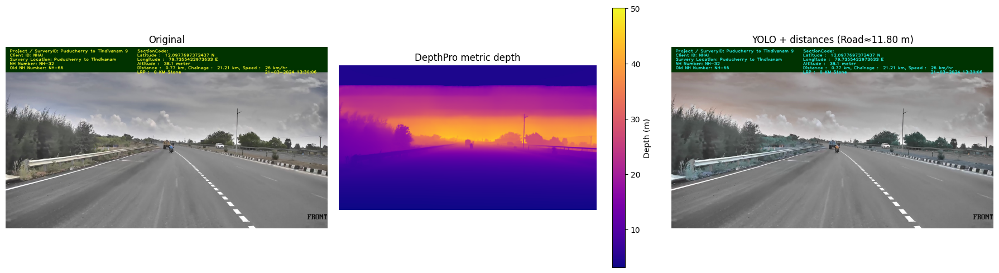

In [ ]:


import torch
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from PIL import Image
import depth_pro

# ---------- CONFIG ----------
WEIGHTS = "/content/bestt.pt"  # your trained YOLO weights
IMAGE_PATH = "/content/76.jpg"       # or any input image path

# ---------- LOAD MODELS ----------
yolo_model = YOLO(WEIGHTS)                                         # object detector[web:52]
dp_model, dp_tf = depth_pro.create_model_and_transforms()          # DepthPro[web:40]
dp_model.eval()

# ---------- RUN DEPTHPRO ----------
rgb, _, f_px = depth_pro.load_rgb(IMAGE_PATH)                      # returns PIL image and focal length[web:40]
img_t = dp_tf(rgb)

with torch.no_grad():
    pred_dp = dp_model.infer(img_t, f_px=f_px)                     # prediction dict[web:40][web:44]
depth = pred_dp["depth"].cpu().numpy()                             # H x W, meters
focal_px = float(pred_dp["focallength_px"])
H, W = depth.shape

# ---------- YOLO DETECTION ----------
res = yolo_model(IMAGE_PATH, conf=0.25, iou=0.5)[0]                # single-image inference[web:52]
names = res.names

# ---------- HELPERS ----------
def estimate_size_3d(box, depth_np, f_px, cx=None, cy=None):
    """
    Estimate object width & height in meters using DepthPro metric depth and pinhole camera model.
    """
    H, W = depth_np.shape
    if cx is None: cx = W / 2.0
    if cy is None: cy = H / 2.0

    x1, y1, x2, y2 = box.xyxy[0].tolist()
    x1 = int(np.clip(x1, 0, W - 1))
    x2 = int(np.clip(x2, 0, W - 1))
    y1 = int(np.clip(y1, 0, H - 1))
    y2 = int(np.clip(y2, 0, H - 1))

    # sample four mid-edge points on the bbox
    uL, vL = x1, (y1 + y2) // 2      # left middle
    uR, vR = x2, (y1 + y2) // 2      # right middle
    uT, vT = (x1 + x2) // 2, y1      # top middle
    uB, vB = (x1 + x2) // 2, y2      # bottom middle

    ZL = float(depth_np[vL, uL])
    ZR = float(depth_np[vR, uR])
    ZT = float(depth_np[vT, uT])
    ZB = float(depth_np[vB, uB])

    if not all(np.isfinite(z) and z > 0 for z in [ZL, ZR, ZT, ZB]):
        return None, None

    def px_to_3d(u, v, Z):
        X = (u - cx) * Z / f_px
        Y = (v - cy) * Z / f_px
        return np.array([X, Y, Z], dtype=float)

    PL = px_to_3d(uL, vL, ZL)
    PR = px_to_3d(uR, vR, ZR)
    PT = px_to_3d(uT, vT, ZT)
    PB = px_to_3d(uB, vB, ZB)

    width_m  = float(np.linalg.norm(PR - PL))
    height_m = float(np.linalg.norm(PB - PT))
    return width_m, height_m

def estimate_road_width(depth_np, f_px, row_ratio=0.6, z_min=5.0, z_max=40.0):
    """
    Estimate road width at a given depth band using one horizontal scan row.
    """
    H, W = depth_np.shape
    row = int(row_ratio * H)
    row_depth = depth_np[row, :]
    valid = (row_depth > z_min) & (row_depth < z_max)
    idx = np.where(valid)[0]
    if len(idx) < 2:
        return None, row, None, None

    x_left, x_right = idx[0], idx[-1]
    z_left, z_right = row_depth[x_left], row_depth[x_right]
    z_mean = 0.5 * (z_left + z_right)
    pixel_width = abs(x_right - x_left)
    road_width_m = pixel_width / f_px * z_mean
    return road_width_m, row, x_left, x_right

# ---------- MAIN LOOP: PER-OBJECT METRICS ----------
print(f"\nImage: {IMAGE_PATH}")
objects_info = []

for box in res.boxes:
    x1, y1, x2, y2 = box.xyxy[0].tolist()
    cls_id = int(box.cls[0].item())
    conf   = float(box.conf[0].item())
    label  = names[cls_id]

    # center depth
    cx, cy = int((x1 + x2) / 2), int((y1 + y2) / 2)
    cy_d = int(np.clip(cy, 0, H - 1))
    cx_d = int(np.clip(cx, 0, W - 1))
    dist_center = float(depth[cy_d, cx_d])

    # width & height
    width_m, height_m = estimate_size_3d(box, depth, focal_px)

    info = {
        "class_name": label,
        "conf": conf,
        "center_distance_m": dist_center,
        "width_m": width_m,
        "height_m": height_m,
        "bbox": [x1, y1, x2, y2],
    }
    objects_info.append(info)

    print(
        f"{label:<20} conf={conf:.2f} "
        f"dist≈{dist_center:.2f} m "
        f"width≈{(width_m or 0):.2f} m "
        f"height≈{(height_m or 0):.2f} m"
    )

# ---------- ROAD WIDTH ESTIMATION ----------
road_width_m, row_used, xL, xR = estimate_road_width(depth, focal_px)
if road_width_m is not None:
    print(f"\nEstimated road width at row {row_used}: ≈ {road_width_m:.2f} m")
else:
    print("\nRoad width could not be estimated (no valid depth band on selected row).")

# ---------- VISUALIZE ----------
plt.figure(figsize=(18, 5))
plt.subplot(1, 3, 1)
plt.imshow(rgb)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 3, 2)
im = plt.imshow(depth, cmap="plasma")
plt.colorbar(im, label="Depth (m)")
plt.title("DepthPro metric depth")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(res.plot())   # YOLO annotated image[web:52]
if road_width_m is not None:
    plt.title(f"YOLO + distances (Road≈{road_width_m:.2f} m)")
else:
    plt.title("YOLO + distances")
plt.axis("off")
plt.tight_layout()
plt.show()


In [ ]:


import depth_pro
from ultralytics import YOLO
import torch, json
import numpy as np
from PIL import Image

# load models
yolo = YOLO("/content/bestt.pt")
dp_model, dp_tf = depth_pro.create_model_and_transforms()
dp_model.eval()


DepthPro(
  (encoder): DepthProEncoder(
    (patch_encoder): VisionTransformer(
      (patch_embed): PatchEmbed(
        (proj): Conv2d(3, 1024, kernel_size=(16, 16), stride=(16, 16))
        (norm): Identity()
      )
      (pos_drop): Dropout(p=0.0, inplace=False)
      (patch_drop): Identity()
      (norm_pre): Identity()
      (blocks): Sequential(
        (0): Block(
          (norm1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
          (attn): Attention(
            (qkv): Linear(in_features=1024, out_features=3072, bias=True)
            (q_norm): Identity()
            (k_norm): Identity()
            (attn_drop): Dropout(p=0.0, inplace=False)
            (norm): Identity()
            (proj): Linear(in_features=1024, out_features=1024, bias=True)
            (proj_drop): Dropout(p=0.0, inplace=False)
          )
          (ls1): LayerScale()
          (drop_path1): Identity()
          (norm2): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
          (mlp)

In [ ]:
def run_depthpro(image_path):
    rgb, _, f_px = depth_pro.load_rgb(image_path)
    t = dp_tf(rgb)
    with torch.no_grad():
        pred = dp_model.infer(t, f_px=f_px)

    depth = pred["depth"]          # DepthPro output
    if isinstance(depth, torch.Tensor):
        depth = depth.cpu().numpy()
    depth = np.squeeze(depth)      # handles 1xHxW or HxW -> HxW

    focal_px = float(pred["focallength_px"])
    return depth, focal_px, np.asarray(rgb)


In [ ]:
HEADER_H = 120   # crop top header (blue strip). Tune if needed.

def process_image(image_path):
    depth, focal_px, rgb = run_depthpro(image_path)

    # depth should be HxW
    if depth.ndim != 2:
        raise RuntimeError(f"Unexpected depth shape: {depth.shape}")

    H, W, _ = rgb.shape
    if depth.shape != (H, W):
        # resize depth to RGB size if needed
        depth = np.array(
            Image.fromarray(depth.astype(np.float32)).resize((W, H), resample=Image.BILINEAR)
        )

    # crop header
    rgb_crop   = rgb[HEADER_H:, :, :]
    depth_crop = depth[HEADER_H:, :]
    Hc, Wc, _  = rgb_crop.shape

    # YOLO inference
    res = yolo(rgb_crop, imgsz=1280, verbose=False)[0]
    names = yolo.names

    # road width estimation (scan row at 75% height)
    scan_row = int(Hc * 0.75)
    d_row = depth_crop[scan_row, :]
    valid = np.where((d_row > 0.1) & (d_row < 200))[0]
    road_width_m = None
    if len(valid) > 20:
        left_px, right_px = valid[0], valid[-1]
        d_mid = float(np.median(d_row[valid]))
        px_width = right_px - left_px
        road_width_m = (px_width * d_mid) / focal_px

    img_center_x = Wc / 2.0

    output = {
        "time_taken": "",

        "road_width_m": round(road_width_m, 2) if road_width_m else None,
        "image_path": image_path,
        "detected_assets": []
    }

    for box in res.boxes:
        # robust extraction of x1,y1,x2,y2
        xyxy = box.xyxy.cpu().numpy()
        if xyxy.ndim == 2:
            xyxy = xyxy[0]
        xyxy = xyxy.flatten()
        if xyxy.size < 4:
            continue
        x1, y1, x2, y2 = xyxy[:4]

        cls_id = int(box.cls.item())
        conf   = float(box.conf.item())
        label  = names[cls_id]

        x1i = int(max(0, min(Wc - 1, x1)))
        x2i = int(max(0, min(Wc - 1, x2)))
        y1i = int(max(0, min(Hc - 1, y1)))
        y2i = int(max(0, min(Hc - 1, y2)))

        cx = int((x1i + x2i) / 2)
        cy = int(y2i - 3)
        cy = max(0, min(Hc - 1, cy))
        d_center = float(depth_crop[cy, cx])

        mid_y = int((y1i + y2i) / 2)
        band = depth_crop[mid_y, x1i:x2i]
        band = band[(band > 0.1) & (band < 200)]
        d_w = float(np.median(band)) if len(band) > 5 else d_center

        px_w = max(1, x2i - x1i)
        px_h = max(1, y2i - y1i)
        asset_width_m = (px_w * d_w) / focal_px
        asset_len_m   = (px_h * d_center) / focal_px

        side = "LHS" if (x1i + x2i) / 2.0 < img_center_x else "RHS"

        asset = {
            "assetname": label,
            "distance_from_cam": round(d_center, 2) if d_center > 0 else None,
            "asset1_len": round(asset_len_m, 2),
            "asset2_wid": round(asset_width_m, 2),
            "side": side,
            "confidence": round(conf, 2)
        }
        output["detected_assets"].append(asset)


    return output


In [ ]:
import json

img = "/content/76.jpg"   # adjust path if needed
result = process_image(img)
print(json.dumps(result, indent=2))


{
  "time_taken": "",
  "road_width_m": 4.19,
  "image_path": "/content/76.jpg",
  "detected_assets": [
    {
      "assetname": "Delineators",
      "distance_from_cam": 16.59,
      "asset1_len": 0.23,
      "asset2_wid": 0.08,
      "side": "RHS",
      "confidence": 0.3
    }
  ]
}


In [ ]:
import json

img = "/content/78.jpg"   # adjust path if needed
result = process_image(img)
print(json.dumps(result, indent=2))


{
  "time_taken": "",
  "road_width_m": 4.47,
  "image_path": "/content/78.jpg",
  "detected_assets": [
    {
      "assetname": "Street Lights",
      "distance_from_cam": 18.88,
      "asset1_len": 3.07,
      "asset2_wid": 0.91,
      "side": "RHS",
      "confidence": 0.44
    }
  ]
}


In [ ]:
import json

img = "/content/example.jpeg"   # adjust path if needed
result = process_image(img)
print(json.dumps(result, indent=2))


In [ ]:
# For best yolo .pt


image 1/1 /content/76.jpg: 736x1280 2 Delineatorss, 1 Street Lights, 66.7ms
Speed: 6.2ms preprocess, 66.7ms inference, 1.5ms postprocess per image at shape (1, 3, 736, 1280)

Image: /content/76.jpg
Street Lights        conf=0.79 dist≈40.42 m width≈0.66 m height≈6.31 m
Delineators          conf=0.62 dist≈17.62 m width≈0.49 m height≈10.48 m
Delineators          conf=0.40 dist≈18.42 m width≈0.31 m height≈6.56 m

Estimated road width at row 648: ≈ 11.80 m


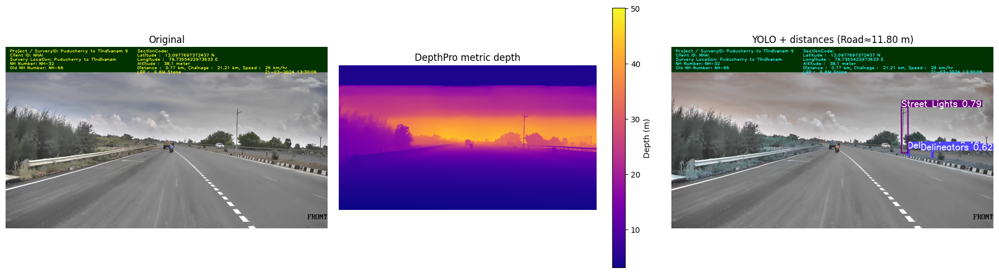

In [ ]:


import torch
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from PIL import Image
import depth_pro

# ---------- CONFIG ----------
WEIGHTS = "/content/latestbest1.pt"  # your trained YOLO weights
IMAGE_PATH = "/content/76.jpg"       # or any input image path

# ---------- LOAD MODELS ----------
yolo_model = YOLO(WEIGHTS)                                         # object detector[web:52]
dp_model, dp_tf = depth_pro.create_model_and_transforms()          # DepthPro[web:40]
dp_model.eval()

# ---------- RUN DEPTHPRO ----------
rgb, _, f_px = depth_pro.load_rgb(IMAGE_PATH)                      # returns PIL image and focal length[web:40]
img_t = dp_tf(rgb)

with torch.no_grad():
    pred_dp = dp_model.infer(img_t, f_px=f_px)                     # prediction dict[web:40][web:44]
depth = pred_dp["depth"].cpu().numpy()                             # H x W, meters
focal_px = float(pred_dp["focallength_px"])
H, W = depth.shape

# ---------- YOLO DETECTION ----------
res = yolo_model(IMAGE_PATH, conf=0.25, iou=0.5)[0]                # single-image inference[web:52]
names = res.names

# ---------- HELPERS ----------
def estimate_size_3d(box, depth_np, f_px, cx=None, cy=None):
    """
    Estimate object width & height in meters using DepthPro metric depth and pinhole camera model.
    """
    H, W = depth_np.shape
    if cx is None: cx = W / 2.0
    if cy is None: cy = H / 2.0

    x1, y1, x2, y2 = box.xyxy[0].tolist()
    x1 = int(np.clip(x1, 0, W - 1))
    x2 = int(np.clip(x2, 0, W - 1))
    y1 = int(np.clip(y1, 0, H - 1))
    y2 = int(np.clip(y2, 0, H - 1))

    # sample four mid-edge points on the bbox
    uL, vL = x1, (y1 + y2) // 2      # left middle
    uR, vR = x2, (y1 + y2) // 2      # right middle
    uT, vT = (x1 + x2) // 2, y1      # top middle
    uB, vB = (x1 + x2) // 2, y2      # bottom middle

    ZL = float(depth_np[vL, uL])
    ZR = float(depth_np[vR, uR])
    ZT = float(depth_np[vT, uT])
    ZB = float(depth_np[vB, uB])

    if not all(np.isfinite(z) and z > 0 for z in [ZL, ZR, ZT, ZB]):
        return None, None

    def px_to_3d(u, v, Z):
        X = (u - cx) * Z / f_px
        Y = (v - cy) * Z / f_px
        return np.array([X, Y, Z], dtype=float)

    PL = px_to_3d(uL, vL, ZL)
    PR = px_to_3d(uR, vR, ZR)
    PT = px_to_3d(uT, vT, ZT)
    PB = px_to_3d(uB, vB, ZB)

    width_m  = float(np.linalg.norm(PR - PL))
    height_m = float(np.linalg.norm(PB - PT))
    return width_m, height_m

def estimate_road_width(depth_np, f_px, row_ratio=0.6, z_min=5.0, z_max=40.0):
    """
    Estimate road width at a given depth band using one horizontal scan row.
    """
    H, W = depth_np.shape
    row = int(row_ratio * H)
    row_depth = depth_np[row, :]
    valid = (row_depth > z_min) & (row_depth < z_max)
    idx = np.where(valid)[0]
    if len(idx) < 2:
        return None, row, None, None

    x_left, x_right = idx[0], idx[-1]
    z_left, z_right = row_depth[x_left], row_depth[x_right]
    z_mean = 0.5 * (z_left + z_right)
    pixel_width = abs(x_right - x_left)
    road_width_m = pixel_width / f_px * z_mean
    return road_width_m, row, x_left, x_right

# ---------- MAIN LOOP: PER-OBJECT METRICS ----------
print(f"\nImage: {IMAGE_PATH}")
objects_info = []

for box in res.boxes:
    x1, y1, x2, y2 = box.xyxy[0].tolist()
    cls_id = int(box.cls[0].item())
    conf   = float(box.conf[0].item())
    label  = names[cls_id]

    # center depth
    cx, cy = int((x1 + x2) / 2), int((y1 + y2) / 2)
    cy_d = int(np.clip(cy, 0, H - 1))
    cx_d = int(np.clip(cx, 0, W - 1))
    dist_center = float(depth[cy_d, cx_d])

    # width & height
    width_m, height_m = estimate_size_3d(box, depth, focal_px)

    info = {
        "class_name": label,
        "conf": conf,
        "center_distance_m": dist_center,
        "width_m": width_m,
        "height_m": height_m,
        "bbox": [x1, y1, x2, y2],
    }
    objects_info.append(info)

    print(
        f"{label:<20} conf={conf:.2f} "
        f"dist≈{dist_center:.2f} m "
        f"width≈{(width_m or 0):.2f} m "
        f"height≈{(height_m or 0):.2f} m"
    )

# ---------- ROAD WIDTH ESTIMATION ----------
road_width_m, row_used, xL, xR = estimate_road_width(depth, focal_px)
if road_width_m is not None:
    print(f"\nEstimated road width at row {row_used}: ≈ {road_width_m:.2f} m")
else:
    print("\nRoad width could not be estimated (no valid depth band on selected row).")

# ---------- VISUALIZE ----------
plt.figure(figsize=(18, 5))
plt.subplot(1, 3, 1)
plt.imshow(rgb)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 3, 2)
im = plt.imshow(depth, cmap="plasma")
plt.colorbar(im, label="Depth (m)")
plt.title("DepthPro metric depth")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(res.plot())   # YOLO annotated image[web:52]
if road_width_m is not None:
    plt.title(f"YOLO + distances (Road≈{road_width_m:.2f} m)")
else:
    plt.title("YOLO + distances")
plt.axis("off")
plt.tight_layout()
plt.show()


In [ ]:


import depth_pro
from ultralytics import YOLO
import torch, json
import numpy as np
from PIL import Image

# load models
yolo = YOLO("/content/latestbest1.pt")
dp_model, dp_tf = depth_pro.create_model_and_transforms()
dp_model.eval()


DepthPro(
  (encoder): DepthProEncoder(
    (patch_encoder): VisionTransformer(
      (patch_embed): PatchEmbed(
        (proj): Conv2d(3, 1024, kernel_size=(16, 16), stride=(16, 16))
        (norm): Identity()
      )
      (pos_drop): Dropout(p=0.0, inplace=False)
      (patch_drop): Identity()
      (norm_pre): Identity()
      (blocks): Sequential(
        (0): Block(
          (norm1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
          (attn): Attention(
            (qkv): Linear(in_features=1024, out_features=3072, bias=True)
            (q_norm): Identity()
            (k_norm): Identity()
            (attn_drop): Dropout(p=0.0, inplace=False)
            (norm): Identity()
            (proj): Linear(in_features=1024, out_features=1024, bias=True)
            (proj_drop): Dropout(p=0.0, inplace=False)
          )
          (ls1): LayerScale()
          (drop_path1): Identity()
          (norm2): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
          (mlp)

In [ ]:
def run_depthpro(image_path):
    rgb, _, f_px = depth_pro.load_rgb(image_path)
    t = dp_tf(rgb)
    with torch.no_grad():
        pred = dp_model.infer(t, f_px=f_px)

    depth = pred["depth"]          # DepthPro output
    if isinstance(depth, torch.Tensor):
        depth = depth.cpu().numpy()
    depth = np.squeeze(depth)      # handles 1xHxW or HxW -> HxW

    focal_px = float(pred["focallength_px"])
    return depth, focal_px, np.asarray(rgb)


In [ ]:
HEADER_H = 120   # crop top header (blue strip). Tune if needed.

def process_image(image_path):
    depth, focal_px, rgb = run_depthpro(image_path)

    # depth should be HxW
    if depth.ndim != 2:
        raise RuntimeError(f"Unexpected depth shape: {depth.shape}")

    H, W, _ = rgb.shape
    if depth.shape != (H, W):
        # resize depth to RGB size if needed
        depth = np.array(
            Image.fromarray(depth.astype(np.float32)).resize((W, H), resample=Image.BILINEAR)
        )

    # crop header
    rgb_crop   = rgb[HEADER_H:, :, :]
    depth_crop = depth[HEADER_H:, :]
    Hc, Wc, _  = rgb_crop.shape

    # YOLO inference
    res = yolo(rgb_crop, imgsz=1280, verbose=False)[0]
    names = yolo.names

    # road width estimation (scan row at 75% height)
    scan_row = int(Hc * 0.75)
    d_row = depth_crop[scan_row, :]
    valid = np.where((d_row > 0.1) & (d_row < 200))[0]
    road_width_m = None
    if len(valid) > 20:
        left_px, right_px = valid[0], valid[-1]
        d_mid = float(np.median(d_row[valid]))
        px_width = right_px - left_px
        road_width_m = (px_width * d_mid) / focal_px

    img_center_x = Wc / 2.0

    output = {
        "time_taken": "",

        "road_width_m": round(road_width_m, 2) if road_width_m else None,
        "image_path": image_path,
        "detected_assets": []
    }

    for box in res.boxes:
        # robust extraction of x1,y1,x2,y2
        xyxy = box.xyxy.cpu().numpy()
        if xyxy.ndim == 2:
            xyxy = xyxy[0]
        xyxy = xyxy.flatten()
        if xyxy.size < 4:
            continue
        x1, y1, x2, y2 = xyxy[:4]

        cls_id = int(box.cls.item())
        conf   = float(box.conf.item())
        label  = names[cls_id]

        x1i = int(max(0, min(Wc - 1, x1)))
        x2i = int(max(0, min(Wc - 1, x2)))
        y1i = int(max(0, min(Hc - 1, y1)))
        y2i = int(max(0, min(Hc - 1, y2)))

        cx = int((x1i + x2i) / 2)
        cy = int(y2i - 3)
        cy = max(0, min(Hc - 1, cy))
        d_center = float(depth_crop[cy, cx])

        mid_y = int((y1i + y2i) / 2)
        band = depth_crop[mid_y, x1i:x2i]
        band = band[(band > 0.1) & (band < 200)]
        d_w = float(np.median(band)) if len(band) > 5 else d_center

        px_w = max(1, x2i - x1i)
        px_h = max(1, y2i - y1i)
        asset_width_m = (px_w * d_w) / focal_px
        asset_len_m   = (px_h * d_center) / focal_px

        side = "LHS" if (x1i + x2i) / 2.0 < img_center_x else "RHS"

        asset = {
            "assetname": label,
            "distance_from_cam": round(d_center, 2) if d_center > 0 else None,
            "asset1_len": round(asset_len_m, 2),
            "asset2_wid": round(asset_width_m, 2),
            "side": side,
            "confidence": round(conf, 2)
        }
        output["detected_assets"].append(asset)


    return output


In [ ]:
import json

img = "/content/76.jpg"   # adjust path if needed
result = process_image(img)
print(json.dumps(result, indent=2))


{
  "time_taken": "",
  "road_width_m": 4.19,
  "image_path": "/content/76.jpg",
  "detected_assets": [
    {
      "assetname": "Street Lights",
      "distance_from_cam": 19.92,
      "asset1_len": 1.99,
      "asset2_wid": 0.59,
      "side": "RHS",
      "confidence": 0.77
    },
    {
      "assetname": "Delineators",
      "distance_from_cam": 18.12,
      "asset1_len": 0.27,
      "asset2_wid": 0.1,
      "side": "RHS",
      "confidence": 0.6
    },
    {
      "assetname": "Delineators",
      "distance_from_cam": 16.53,
      "asset1_len": 0.23,
      "asset2_wid": 0.07,
      "side": "RHS",
      "confidence": 0.57
    },
    {
      "assetname": "Median Plantation",
      "distance_from_cam": 9.29,
      "asset1_len": 0.54,
      "asset2_wid": 2.04,
      "side": "RHS",
      "confidence": 0.34
    },
    {
      "assetname": "Street Lights",
      "distance_from_cam": 33.86,
      "asset1_len": 0.69,
      "asset2_wid": 0.34,
      "side": "LHS",
      "confidence": 0.29
 

In [ ]:
import json

img = "/content/78.jpg"   # adjust path if needed
result = process_image(img)
print(json.dumps(result, indent=2))


{
  "time_taken": "",
  "road_width_m": 4.47,
  "image_path": "/content/78.jpg",
  "detected_assets": [
    {
      "assetname": "Street Lights",
      "distance_from_cam": 15.58,
      "asset1_len": 2.6,
      "asset2_wid": 0.75,
      "side": "RHS",
      "confidence": 0.71
    },
    {
      "assetname": "Street Lights",
      "distance_from_cam": 14.98,
      "asset1_len": 2.6,
      "asset2_wid": 0.52,
      "side": "RHS",
      "confidence": 0.55
    },
    {
      "assetname": "Metal Beam Crash Barrier (MBCB)",
      "distance_from_cam": 21.01,
      "asset1_len": 0.53,
      "asset2_wid": 4.74,
      "side": "RHS",
      "confidence": 0.46
    },
    {
      "assetname": "Street Lights",
      "distance_from_cam": 37.48,
      "asset1_len": 0.74,
      "asset2_wid": 0.37,
      "side": "RHS",
      "confidence": 0.41
    },
    {
      "assetname": "Street Lights",
      "distance_from_cam": 45.42,
      "asset1_len": 0.9,
      "asset2_wid": 0.36,
      "side": "LHS",
      "c

In [ ]:
import json

img = "/content/example.jpeg"   # adjust path if needed
result = process_image(img)
print(json.dumps(result, indent=2))


{
  "time_taken": "",
  "road_width_m": 3.18,
  "image_path": "/content/example.jpeg",
  "detected_assets": [
    {
      "assetname": "Sign Boards",
      "distance_from_cam": 3.27,
      "asset1_len": 0.7,
      "asset2_wid": 0.5,
      "side": "LHS",
      "confidence": 0.86
    },
    {
      "assetname": "Street Lights",
      "distance_from_cam": 6.36,
      "asset1_len": 0.88,
      "asset2_wid": 0.34,
      "side": "LHS",
      "confidence": 0.83
    },
    {
      "assetname": "Concrete Barrier",
      "distance_from_cam": 6.4,
      "asset1_len": 0.23,
      "asset2_wid": 0.13,
      "side": "RHS",
      "confidence": 0.74
    },
    {
      "assetname": "Concrete Barrier",
      "distance_from_cam": 6.34,
      "asset1_len": 0.15,
      "asset2_wid": 0.2,
      "side": "RHS",
      "confidence": 0.68
    },
    {
      "assetname": "Sign Boards",
      "distance_from_cam": 14.14,
      "asset1_len": 0.26,
      "asset2_wid": 0.24,
      "side": "RHS",
      "confidence": 0.4

In [ ]:
# 24-12-2025 Removing some assets

In [2]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [3]:
!cp /content/drive/MyDrive/object4.zip /content/


In [4]:
!unzip -o /content/object4.zip -d /content/object4


Archive:  /content/object4.zip
  inflating: /content/object4/dataset5/data.yaml  
   creating: /content/object4/dataset5/images/
   creating: /content/object4/dataset5/labels/
  inflating: /content/object4/dataset5/labels/train.cache  
   creating: /content/object4/dataset5/labels/train/
  inflating: /content/object4/dataset5/labels/train/0.txt  
  inflating: /content/object4/dataset5/labels/train/1.txt  
  inflating: /content/object4/dataset5/labels/train/10.txt  
  inflating: /content/object4/dataset5/labels/train/100.txt  
  inflating: /content/object4/dataset5/labels/train/1000.txt  
  inflating: /content/object4/dataset5/labels/train/1001.txt  
  inflating: /content/object4/dataset5/labels/train/1002.txt  
  inflating: /content/object4/dataset5/labels/train/1003.txt  
  inflating: /content/object4/dataset5/labels/train/1004.txt  
  inflating: /content/object4/dataset5/labels/train/1005.txt  
  inflating: /content/object4/dataset5/labels/train/1006.txt  
  inflating: /content/objec

In [5]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 21.4 MB/s eta 0:00:00


In [7]:
%%writefile /content/object4/dataset5/data.yaml
train: /content/object4/dataset5/images/train
val: /content/object4/dataset5/images/val

nc: 39
names: ['Acoustic Barrier', 'Avenue Plantation', 'Bus Bay & Shelters' ,'CCTV', 'Chevron Signs', 'Concrete Barrier', 'Delineators',
        'ECB (SOS Facility)', 'Entry & Exit', 'Fencing', 'Footpath', 'Fuel Station', 'Gantry Boards', 'Hectometer stones', 'High Mast Light', 'Kerb', 'Ordinary Kilometer stones', 'Land Use', 'Major Intersections', 'Median Drain', 'Median Openings', 'Median Plantation', 'Metal Beam Crash Barrier (MBCB)', 'Minor Intersection', 'New Jersey Crash Barrier', 'OHM', 'Parapet wall', 'Pedestrian Guard Rail', 'Ramps',
        'RCC Railing', 'Road Studs', 'Safety Hand Railing', 'Service Roads/ Slip Roads', 'Shoulder Drains', 'Sign Boards', 'Solar LED Blinkers', 'Street Lights', 'Toll Plaza', 'VMS']


Overwriting /content/object4/dataset5/data.yaml


In [8]:
from ultralytics import YOLO

model = YOLO("/content/drive/MyDrive/latestbest3.pt")

model.train(
    data="/content/object4/dataset5/data.yaml",
    epochs=40,
    imgsz=1280,
    batch=8,
    lr0=0.0005,      # LOWER LR for pseudo-labels
    patience=30,
    device=0
)



Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/object4/dataset5/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=40, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1280, int8=False, iou=0.7, ker

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  9, 10, 11, 12, 13, 14, 15, 16, 21, 22, 24, 26, 27, 29, 30, 31, 33, 34, 35, 36, 37, 38])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x793b1c8834d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.0

In [9]:
from ultralytics import YOLO

model = YOLO("/content/runs/detect/train/weights/best.pt")  # or your trained .pt

metrics = model.val(data="/content/object4/dataset5/data.yaml")
print("Mean Precision:", metrics.box.mp)
print("Mean Recall:", metrics.box.mr)
print("mAP@0.5:", metrics.box.map50)
print("mAP@0.5:0.95:", metrics.box.map)


Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,862,341 parameters, 0 gradients, 78.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2673.8±1543.1 MB/s, size: 461.9 KB)
val: Scanning /content/object4/dataset5/labels/val.cache... 404 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 404/404 868.1Kit/s 0.0s
val: /content/object4/dataset5/images/val/f17 (23).jpg: corrupt JPEG restored and saved
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 26/26 1.1s/it 29.0s
                   all        404       1773      0.466      0.495      0.463      0.219
      Acoustic Barrier         16         20      0.435        0.4      0.472        0.2
     Avenue Plantation         32         41      0.353      0.366       0.37      0.153
    Bus Bay & Shelters         28         29      0.596      0.621      0.661      0.312
                  CCTV         22    

In [10]:
from ultralytics import YOLO

model = YOLO("/content/drive/MyDrive/latestbest3.pt")

metrics = model.val(
    data="/content/object4/dataset5/data.yaml",
    imgsz=1280,          # or 512, same as you used for training
    device=0,       # your Mac GPU
)

accuracy = metrics.box.map50 * 100  # mAP@50 as single accuracy %
print(f"Accuracy: {accuracy:.2f}%")

Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,862,341 parameters, 0 gradients, 78.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2682.7±2436.1 MB/s, size: 426.2 KB)
val: Scanning /content/object4/dataset5/labels/val.cache... 404 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 404/404 976.7Kit/s 0.0s
val: /content/object4/dataset5/images/val/f17 (23).jpg: corrupt JPEG restored and saved
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 26/26 1.1s/it 28.7s
                   all        404       1773      0.607      0.446      0.477      0.234
      Acoustic Barrier         16         20      0.717       0.35      0.466      0.215
     Avenue Plantation         32         41      0.397      0.293      0.319      0.123
    Bus Bay & Shelters         28         29       0.67      0.559      0.658      0.315
                  CCTV         22    

In [11]:
from ultralytics import YOLO

# Load YOLO .pt model
model = YOLO("/content/drive/MyDrive/latestbest3.pt")

# Export to ONNX
model.export(
    format="onnx",
    imgsz=1280,     # use same size as training
    opset=12,
    simplify=True,
    device=0
)


Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/
Model summary (fused): 92 layers, 25,862,341 parameters, 0 gradients, 78.8 GFLOPs

PyTorch: starting from '/content/drive/MyDrive/latestbest3.pt' with input shape (1, 3, 1280, 1280) BCHW and output shape(s) (1, 43, 33600) (49.7 MB)
requirements: Ultralytics requirements ['onnx>=1.12.0,<2.0.0', 'onnxslim>=0.1.71', 'onnxruntime-gpu'] not found, attempting AutoUpdate...
Using Python 3.12.12 environment at: /usr
Resolved 14 packages in 274ms
Prepared 6 packages in 3.52s
Installed 6 packages in 240ms
 + colorama==0.4.6
 + coloredlogs==15.0.1
 + humanfriendly==10.0
 + onnx==1.20.0
 + onnxruntime-gpu==1.23.2
 + onnxslim==0.1.80

requirements: AutoUpdate success ✅ 4.7s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


ONNX: starting exp

'/content/drive/MyDrive/latestbest3.onnx'